In [1]:
import rootutils
import random
import numpy as np
from torchvision.transforms import Compose
import matplotlib.pyplot as plt
import cv2
from functools import partial 
import os 
import pickle
import random
import torch
import torchvision
from torchvision.io import write_video
from torchvision.transforms import PILToTensor
from PIL import Image
from tqdm import tqdm
import seaborn as sns
import torchvision.transforms.v2 as tf

sns.set_theme(context ='paper',style='whitegrid')


path = '/idiap/temp/pvuillecard/projects/gaze_pretrain/'
rootutils.setup_root(path, indicator=".project-root", pythonpath=True)

PosixPath('/remote/idiap.svm/temp.perception01/pvuillecard/projects/gaze_pretrain')

In [2]:
import torch 
from torchvision.ops import box_convert

def get_head_bbox_crop(head_bbox,ratio=0.1):
    bbox = np.array(head_bbox).reshape(1,4)
    bbox = torch.from_numpy(np.array(bbox))
    bbox_cxcywh = box_convert(bbox, in_fmt="xyxy", out_fmt="cxcywh")
    # make it square
    sizes = torch.max(bbox_cxcywh[:, 2:], 1)[0]
    sizes = torch.stack([sizes, sizes], 1)
    # increase the size
    bbox_cxcywh[:, 2:] = sizes + (sizes * ratio)
    bbox = box_convert(bbox_cxcywh, in_fmt="cxcywh", out_fmt="xyxy")
    return bbox.numpy().astype(int)[0]

def draw_3D_vector(image, vector, pos, color=(0,0,255), thickness=2, d= 10):
    w = image.shape[1]
    h = image.shape[0]

    length = w * d
    thickness_ = max(int(w * thickness), 1)
    # dx = -length * np.sin(pitch_yaw[1]) * np.cos(pitch_yaw[0])
    # dy = -length * np.sin(pitch_yaw[0])
    gaze_dir = vector / np.linalg.norm(vector)
    dx = -length * gaze_dir[0]
    dy = -length * gaze_dir[1]
    z = int(255*(gaze_dir[2] + 1)/2)
    cv2.circle(
        image, 
        tuple(np.round(pos).astype(np.int32)),
        int(length)+1, 
        (255,255,0), 
        int(thickness_/2))
    
    cv2.arrowedLine(
        image,
        tuple(np.round(pos).astype(np.int32)),
        tuple(np.round([pos[0] + dx, pos[1] + dy]).astype(int)),
        ((255-z),0,z),
        thickness_,
        cv2.LINE_AA,
        tipLength=0.2,
    )
    return image

def draw_3D_gaze(image, gaze, color=(0,0,255), thickness=2, d= 10, d_top= 0.9, apply_zero_corner= True):
    w = image.shape[1]
    h = image.shape[0]

    pos = [w // 2, h // 2]
    length = w * d
    thickness_ = max(int(w * thickness), 1)
    # dx = -length * np.sin(pitch_yaw[1]) * np.cos(pitch_yaw[0])
    # dy = -length * np.sin(pitch_yaw[0])
    gaze_dir = gaze / np.linalg.norm(gaze)
    dx = -length * gaze_dir[0]
    dy = -length * gaze_dir[1]

    cv2.circle(
        image, 
        tuple(np.round(pos).astype(np.int32)),
        int(length)+1, 
        (255,255,0), 
        int(thickness_/2))
    cv2.arrowedLine(
        image,
        tuple(np.round(pos).astype(np.int32)),
        tuple(np.round([pos[0] + dx, pos[1] + dy]).astype(int)),
        color,
        thickness_,
        cv2.LINE_AA,
        tipLength=0.2,
    )

    w_top = 0.3*w
    h_top = 0.3*h
    pos = [w_top//2, h_top//2]

    length = w_top * d_top
    dx = -length * gaze_dir[0]
    dz = -length * gaze_dir[2]

    if apply_zero_corner:
        #image[:int(h_top), :int(w_top)] = 255
        radius = length
        cv2.circle(image, tuple(np.round(pos).astype(np.int32)), int(radius)+1, (255,255,255), -1)
        cv2.circle(image, tuple(np.round(pos).astype(np.int32)), int(radius)+1, (255,255,0), int(thickness_/2))
    
    cv2.arrowedLine(
        image,
        tuple(np.round(pos).astype(np.int32)),
        tuple(np.round([pos[0] + dx, pos[1] + dz]).astype(int)),
        color,
        thickness_,
        cv2.LINE_AA,
        tipLength=0.2,
    )
    
    return image

def compute_angular_error(pred,gt):
    pred_norm = pred/np.linalg.norm(pred)
    gt_norm = gt/np.linalg.norm(gt)
    error = np.arccos(np.clip(np.dot(pred_norm,gt_norm), -1.0, 1.0))*180/np.pi
    return error

def get_preditction(dataset_name, file):
    mode_angular = 'cartesian'
    exp_results = pickle.load(open(file, 'rb'))
 
    k = 2 if mode_angular == 'spherical' else 3
    exp_results['frame_pred'] = exp_results['frame_pred'].view(-1, k).numpy()
    exp_results['frame_gt'] = exp_results['frame_gt'].view(-1, k).numpy()
    exp_results['frame_id'] = exp_results['frame_id'].view(-1).numpy()
    exp_results['video_id'] = exp_results['video_id'].view(-1).numpy()
    exp_results['person_id'] = exp_results['person_id'].view(-1).numpy()
    exp_results['data_id'] = exp_results['data_id'].view(-1).numpy()

    

    if dataset_name == 'gaze360':
        pred_gaze360 = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 1:
                pred_gaze360[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_gaze360
    
    elif dataset_name == 'gaze360video':
        pred_gaze360video = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 7:
                pred_gaze360video[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_gaze360video
    
    elif dataset_name == 'gifie':
        pred_gifie = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 2:
                pred_gifie[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_gifie
    elif dataset_name == 'follow':
        pred_follow = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 4:
                pred_follow[f'frame_{exp_results["frame_id"][i]:08d}_face_{exp_results["person_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_follow
    
    elif dataset_name == 'mpsgaze':
        pred_mpsgaze = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 3:
                pred_mpsgaze[f'frame_{exp_results["frame_id"][i]:08d}_face_{exp_results["person_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_mpsgaze
    
    elif dataset_name == 'eyediap':
        pred_eyediap = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 6:
                pred_eyediap[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_eyediap
    elif dataset_name == 'eyediap_video':
        pred_eyediap_video = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 11:
                pred_eyediap_video[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_eyediap_video
    
    elif dataset_name == 'mpiiface':
        pred_mpiiface = {}
        for i in range(len(exp_results['frame_id'])):
            if exp_results['data_id'][i] == 12:
                person = 0
                pred_mpiiface[f'frame_{exp_results["frame_id"][i]:08d}'] = {
                    'frame_pred': exp_results['frame_pred'][i],
                    'frame_gt': exp_results['frame_gt'][i]
                }
        return pred_mpiiface

### Visualization of missed examples in GFIE

In [3]:
# load gazefollow database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'GFIE/gfie_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)
#image_keys = list(image_db.keys())
# model prediction 
pred = {
    'Gaze360I&V': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl', 
    'Gaze360I&V GF': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-11_16-08-57/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl',
}

# load prediction
pred = {k: get_preditction('gifie', v) for k,v in pred.items()}
image_keys = list(pred['Gaze360I&V'].keys())

def draw_gaze(keys):
    image = cv2.imread(image_db[keys]['image_path_crop'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax = ax.flatten()
    gaze_gt = image_db[keys]['other']['gaze_direction']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    for i , (name , pred_db) in enumerate(pred.items()):
        img_tmp = image.copy()
        
        gaze_pred = pred_db[keys]['frame_pred']
        angular_error = compute_angular_error(gaze_pred, gaze_gt)
        img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
        cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        ax[i].imshow(img_tmp)
        ax[i].set_title(name)
        ax[i].axis('off')
    plt.show()

clip_00000098_frame_00000236


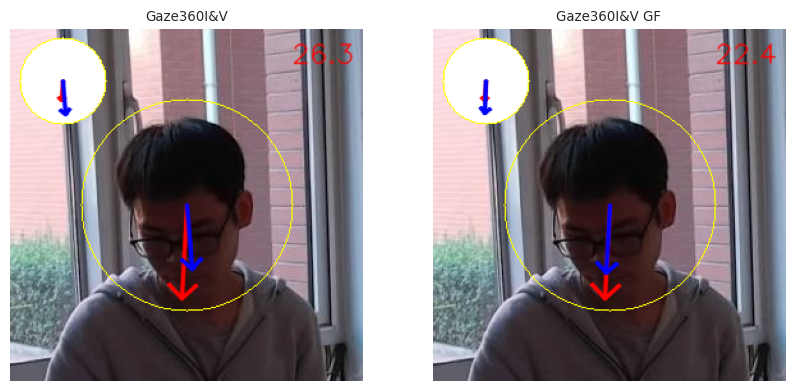

In [4]:
random_key = random.choice(image_keys)
print(random_key)
draw_gaze(random_key)

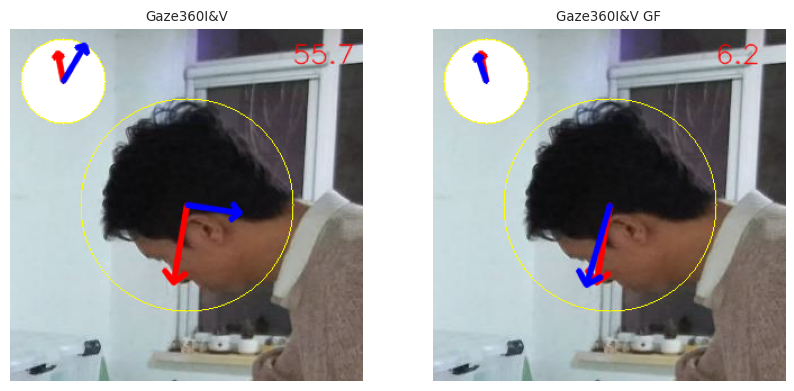

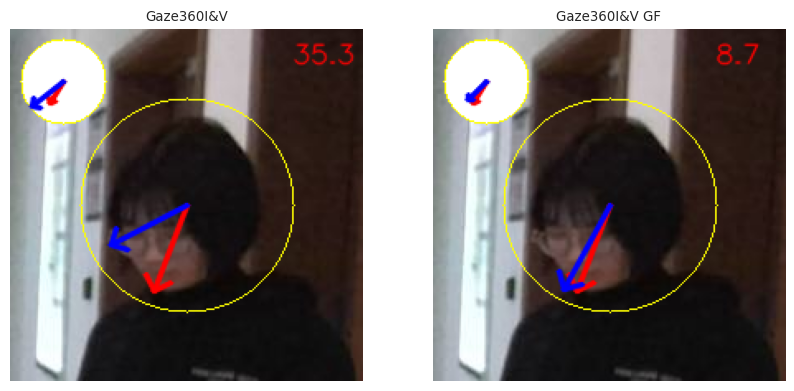

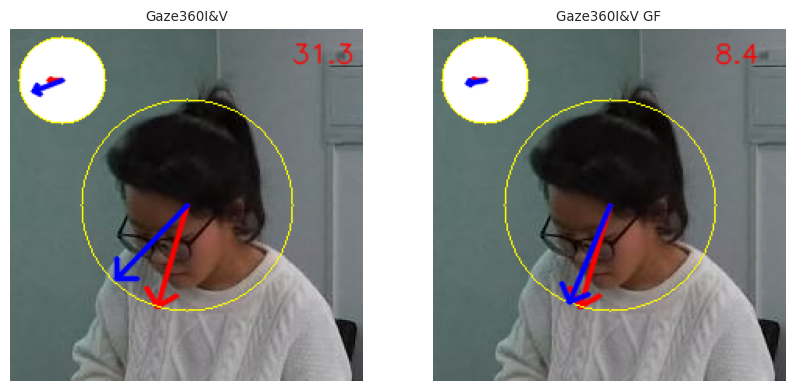

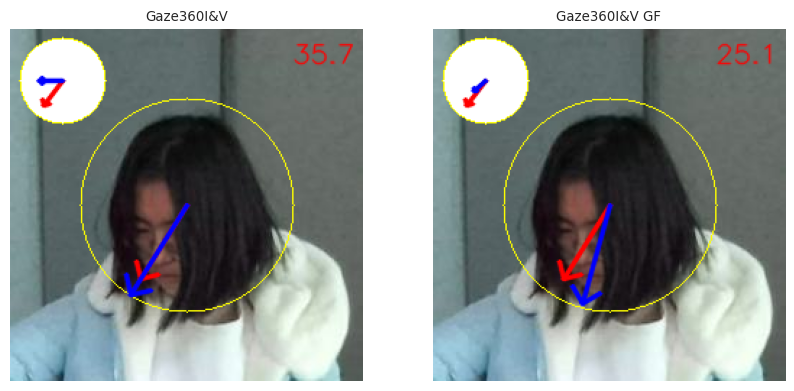

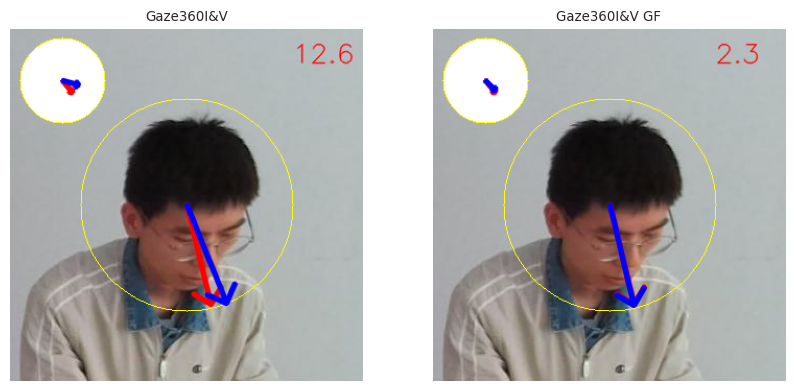

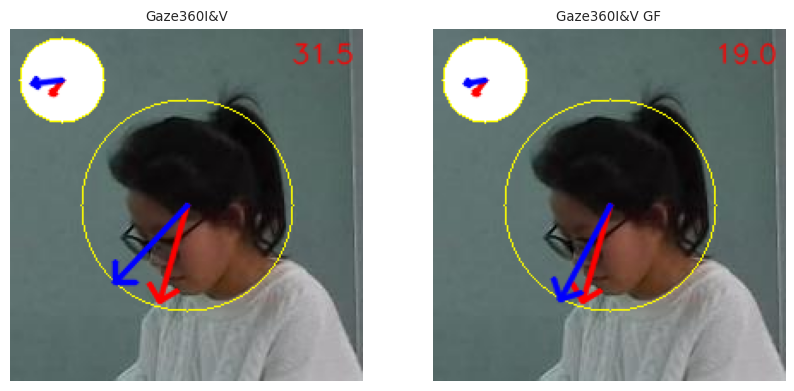

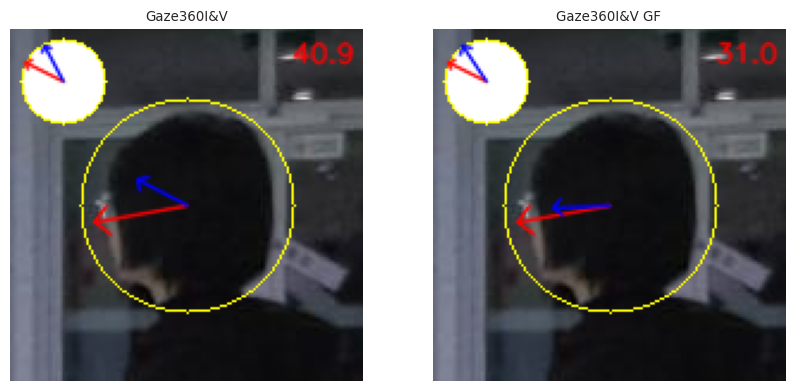

In [6]:
examples = [
    'clip_00000059_frame_00000259',
    'clip_00000053_frame_00000153',
    'clip_00000019_frame_00000847',
    'clip_00000016_frame_00000438',
    'clip_00000101_frame_00000360',
    'clip_00000019_frame_00000575',
    'clip_00000053_frame_00000417'
]
for key in examples:
    draw_gaze(key)

In [ ]:
# Check for huge errors 
angular_errors = {}

for keys in image_keys:
    angular_error_1 = compute_angular_error(pred['Gaze360I&V'][keys]['frame_pred'], image_db[keys]['other']['gaze_direction'])
    angular_error_2 = compute_angular_error(pred['Gaze360I&V GF'][keys]['frame_pred'], image_db[keys]['other']['gaze_direction'])
    angular_errors[keys] = angular_error_1 - angular_error_2

# sort 
sorted_angular_errors = sorted(angular_errors.items(), key=lambda x: x[1], reverse=True)
print(sorted_angular_errors[:10])

for random_key in sorted_angular_errors[20:30]:
    key = random_key[0]
    print(key)
    draw_gaze(key)

clip_00000016_frame_00000255


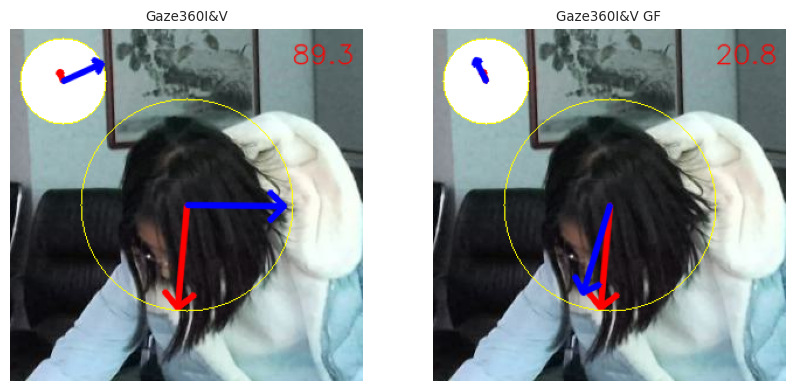

clip_00000053_frame_00000104


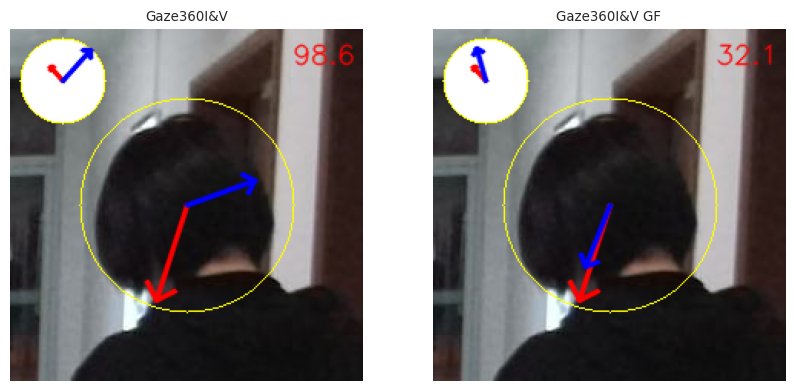

clip_00000054_frame_00000049


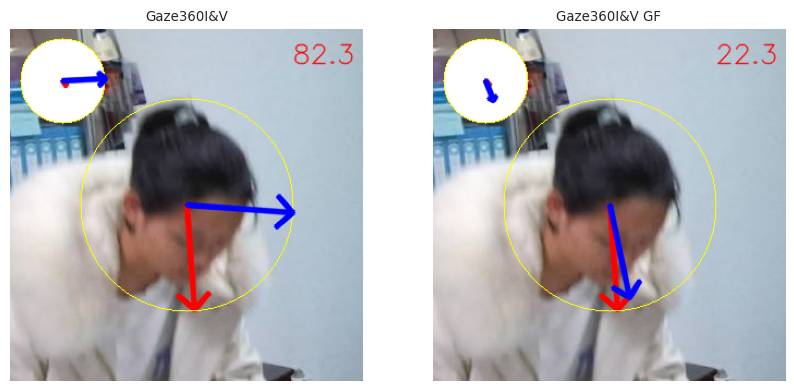

clip_00000059_frame_00000247


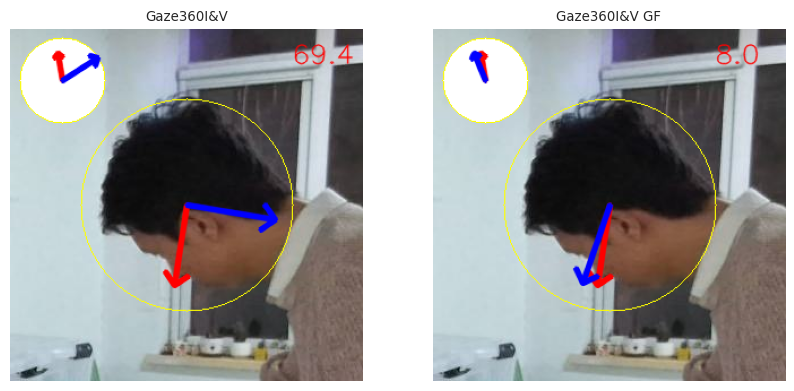

clip_00000056_frame_00000320


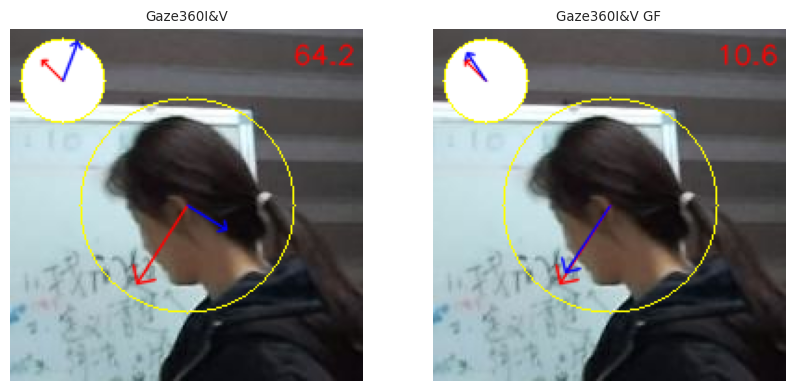

In [7]:
examples = [
    'clip_00000016_frame_00000255',
    'clip_00000053_frame_00000104',
    'clip_00000054_frame_00000049',
    'clip_00000059_frame_00000247',
    'clip_00000056_frame_00000320'
]

for key in examples:
    print(key)
    draw_gaze(key)

In [18]:
def draw_gaze_final(keys):
    image = cv2.imread(image_db[keys]['image_path_crop'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (600,600))
    width, height = image.shape[1], image.shape[0]
    #fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    gaze_gt = image_db[keys]['other']['gaze_direction']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4)
    gaze_pred = pred['Gaze360I&V'][keys]['frame_pred']
    gaze_pred_gf = pred['Gaze360I&V GF'][keys]['frame_pred']
    angular_error = compute_angular_error(gaze_pred, gaze_gt)
    angular_error_gf = compute_angular_error(gaze_pred_gf, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred_gf, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    #cv2.putText(img_tmp, f'Error', (int(0.8*width), int(0.08*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255,255,0), 1, cv2.LINE_AA)
    cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.08*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (0, 0, 255), 1, cv2.LINE_AA)
    cv2.putText(img_tmp, f'{angular_error_gf:.1f}', (int(0.8*width), int(0.16*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
    
    img_tmp = cv2.cvtColor(img_tmp, cv2.COLOR_BGR2RGB)
    # ax.imshow(img_tmp)
    # ax.set_title('image')
    # ax.axis('off')
    # plt.show()
    return img_tmp

examples = [ 
    'clip_00000016_frame_00000255',
    'clip_00000056_frame_00000320',
    #'clip_00000053_frame_00000104'
    ]

for i, key in enumerate(examples):
    print(key)
    img = draw_gaze_final(key)
    cv2.imwrite(f'paper_images/main_plot/gaze_image_gfie_{i}.png',img)

clip_00000016_frame_00000255
clip_00000056_frame_00000320


### Visualize prediction on MPIIGaze 


In [52]:

# load gazefollow database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'MPIIFace/mpiiface_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)

image_db = {k.split("_face_")[0]: v for k,v in image_db.items()}
#image_keys = list(image_db.keys())
# model prediction 
pred = {
    'Gaze360I&V': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl', 
    'Gaze360I&V GF': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-11_16-08-57/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl',
}

# load prediction
pred = {k: get_preditction('mpiiface', v) for k,v in pred.items()}
image_keys = list(pred['Gaze360I&V'].keys())

def draw_gaze(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_yolo_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox)
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    
    print(head_bbox)
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax = ax.flatten()
    gaze_gt = image_db[keys]['other']['gaze_vector']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    for i , (name , pred_db) in enumerate(pred.items()):
        img_tmp = image.copy()
        
        gaze_pred = pred_db[keys]['frame_pred']
        angular_error = compute_angular_error(gaze_pred, gaze_gt)
        img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
        cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        ax[i].imshow(img_tmp)
        ax[i].set_title(name)
        ax[i].axis('off')
    plt.show()

In [ ]:
random_key = random.choice(image_keys)
print(random_key)
draw_gaze(random_key)

[('frame_00011787', 27.779347436033728), ('frame_00010472', 27.508330104774757), ('frame_00009210', 26.675087385865904), ('frame_00010736', 26.389194390485645), ('frame_00010709', 25.78260568576482), ('frame_00010941', 25.176121095325193), ('frame_00011132', 23.89756814240981), ('frame_00009059', 23.896127933847563), ('frame_00009361', 23.424414070782028), ('frame_00009742', 23.34779562703011)]
frame_00030506
tensor([[328,  24, 563, 562]])


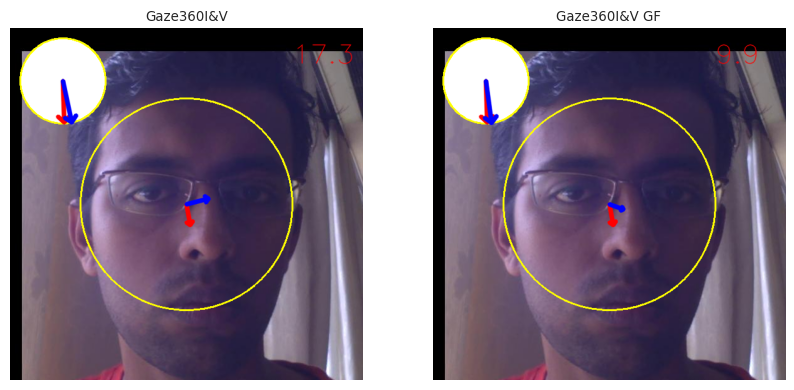

frame_00032410
tensor([[328,  24, 563, 562]])


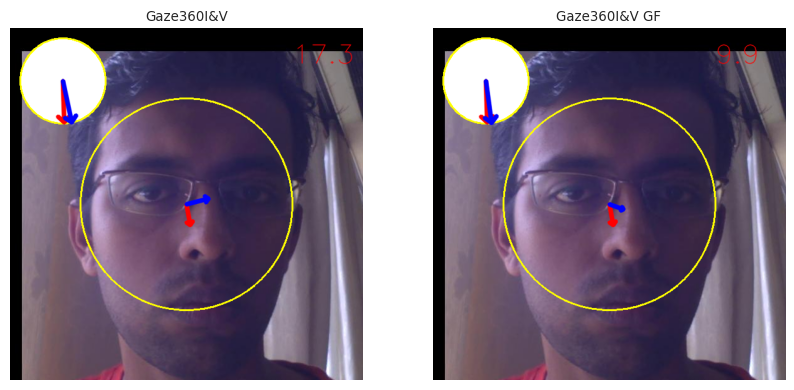

frame_00031966
tensor([[402, -25, 554, 553]])


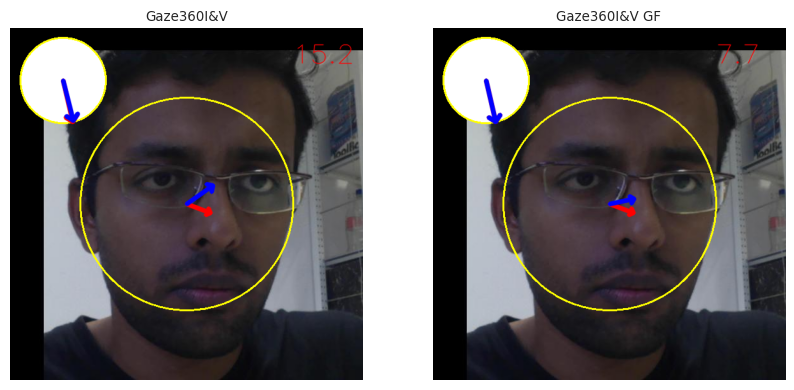

frame_00019327
tensor([[469, 214, 365, 364]])


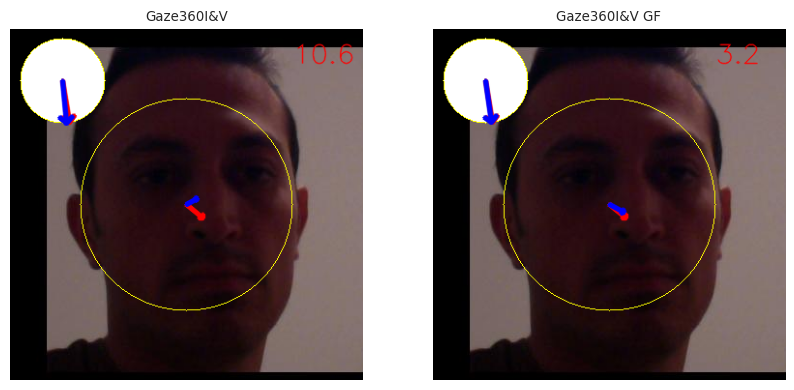

frame_00010485
tensor([[262, -33, 737, 736]])


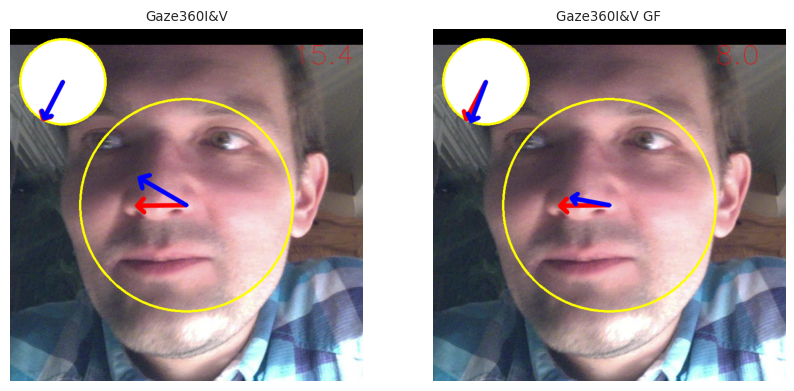

frame_00036516
tensor([[536, 188, 358, 358]])


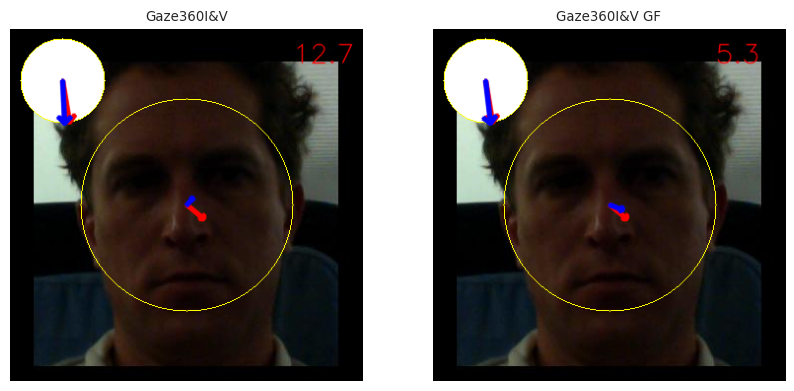

frame_00038426
tensor([[536, 188, 358, 358]])


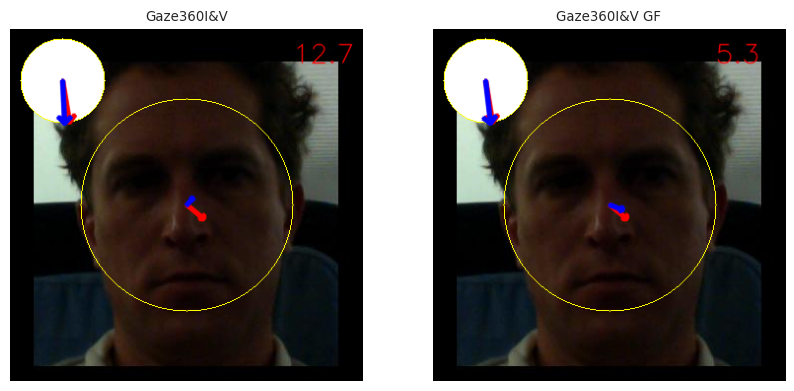

frame_00018527
tensor([[431, 324, 415, 414]])


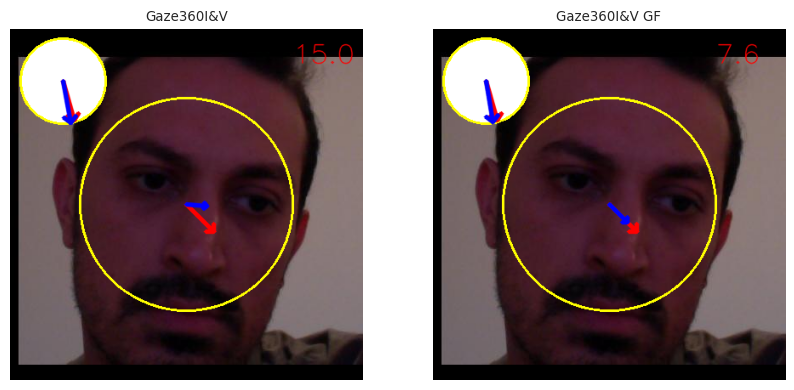

frame_00020913
tensor([[431, 324, 415, 414]])


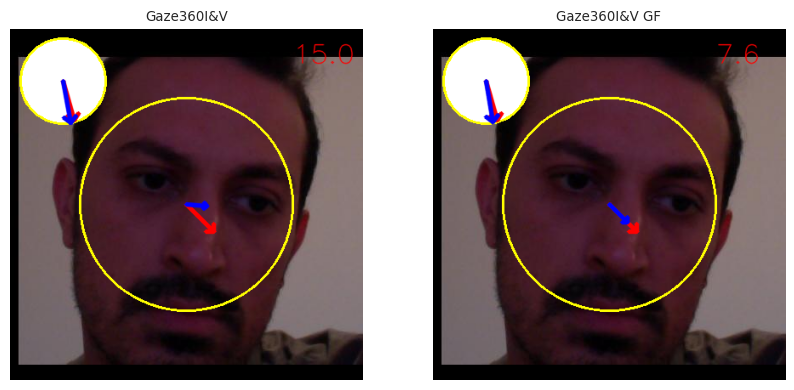

frame_00030146
tensor([[394, -25, 554, 553]])


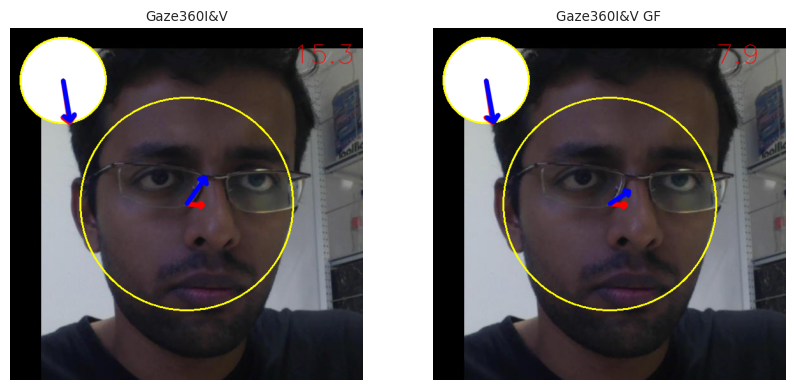

frame_00010590
tensor([[372, -25, 570, 568]])


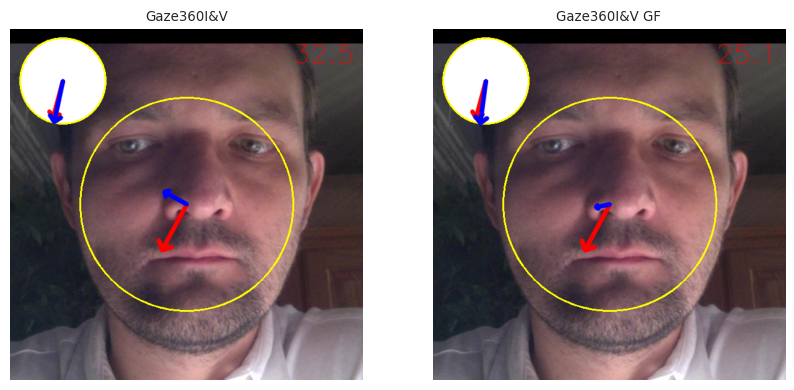

frame_00030042
tensor([[377,  12, 510, 510]])


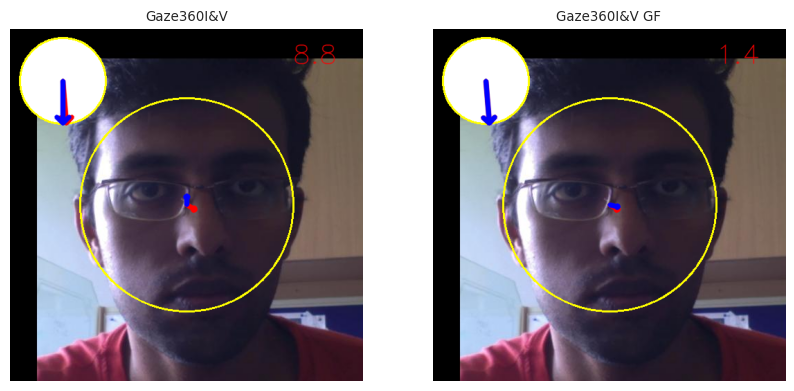

frame_00031936
tensor([[377,  12, 510, 510]])


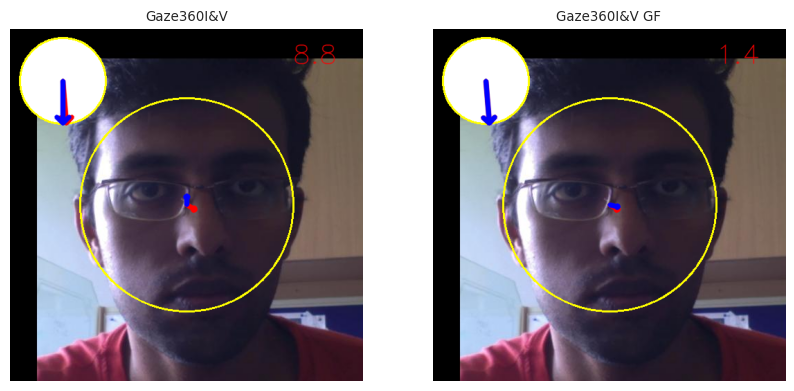

frame_00018107
tensor([[481, 169, 495, 495]])


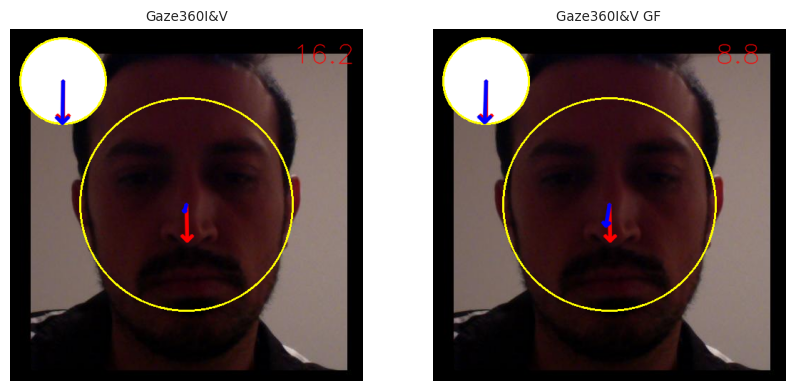

frame_00019803
tensor([[481, 169, 495, 495]])


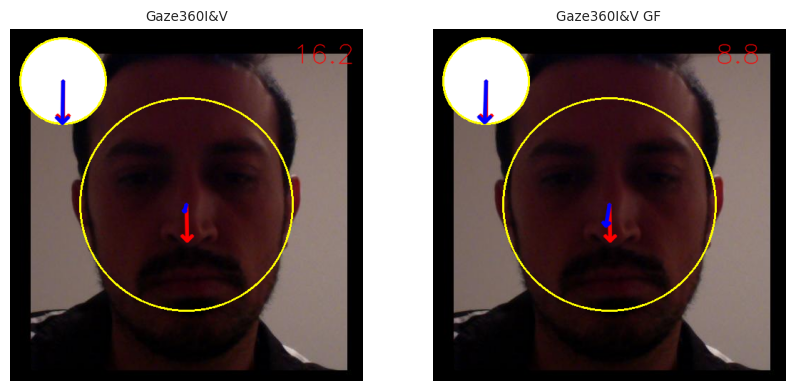

frame_00025243
tensor([[508, 211, 570, 570]])


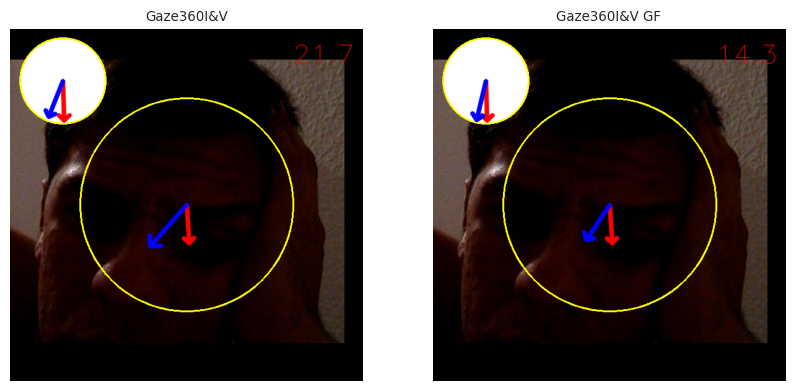

frame_00033920
tensor([[451, 192, 477, 477]])


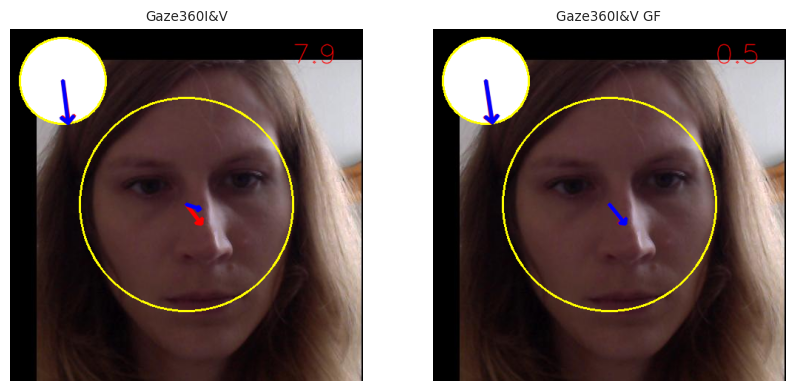

frame_00010791
tensor([[332, -29, 657, 655]])


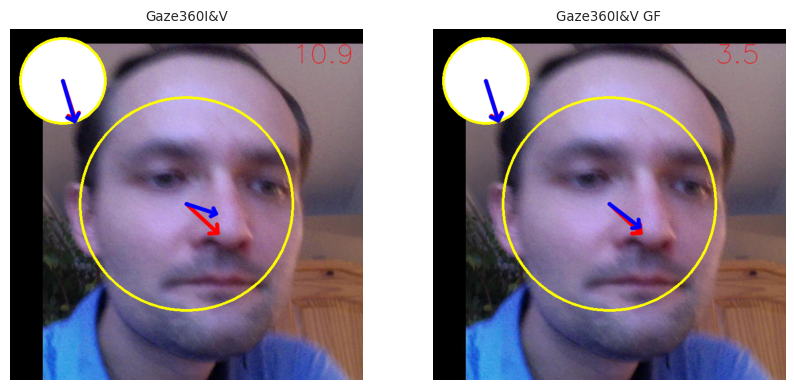

frame_00010170
tensor([[340, -29, 638, 638]])


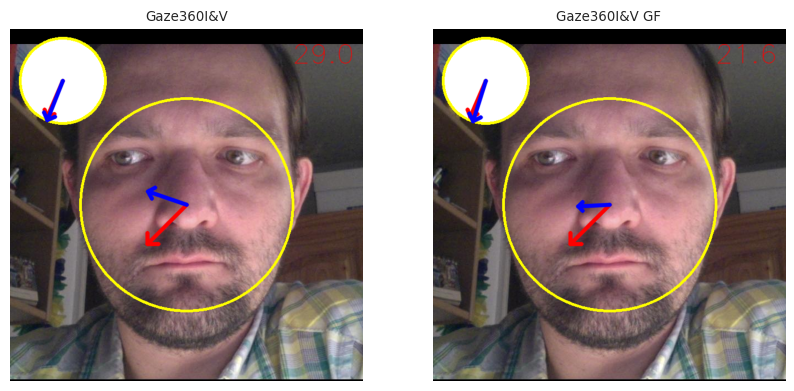

frame_00011712
tensor([[340, -29, 638, 638]])


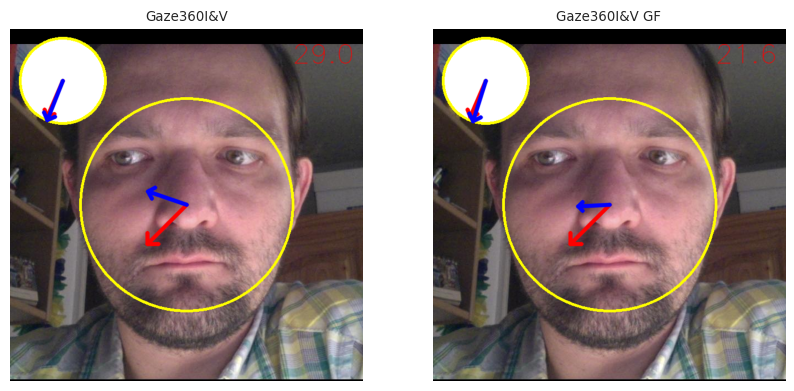

In [28]:
# Check for huge errors 
angular_errors = {}

for keys in image_keys:
    angular_error_1 = compute_angular_error(pred['Gaze360I&V'][keys]['frame_pred'], image_db[keys]['other']['gaze_vector'])
    angular_error_2 = compute_angular_error(pred['Gaze360I&V GF'][keys]['frame_pred'], image_db[keys]['other']['gaze_vector'])
    angular_errors[keys] = angular_error_1 - angular_error_2

# sort 
sorted_angular_errors = sorted(angular_errors.items(), key=lambda x: x[1], reverse=True)
print(sorted_angular_errors[:10])

for random_key in sorted_angular_errors[2000:2020]:
    key = random_key[0]
    print(key)
    draw_gaze(key)

frame_00041135
tensor([[536, -22, 494, 493]])


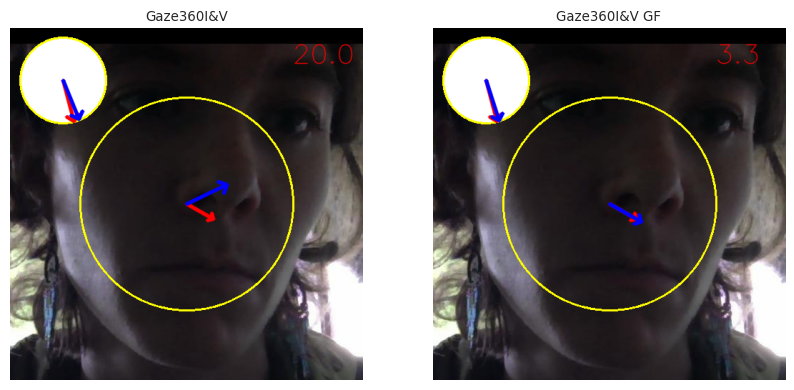

frame_00032918
tensor([[327, -24, 544, 543]])


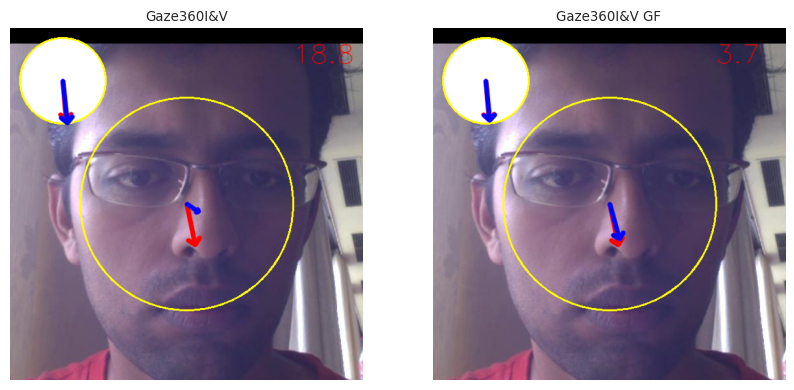

frame_00036744
tensor([[643, 281, 363, 363]])


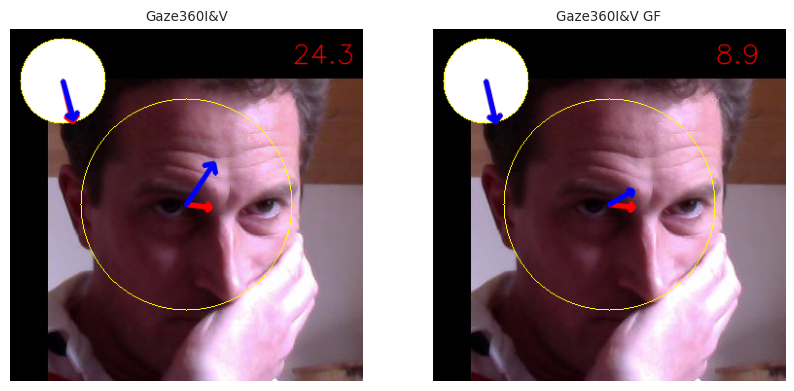

In [20]:
examples = [
    'frame_00041135',
    'frame_00032918',
    'frame_00036744',
    ]
for i, key in enumerate(examples):
    print(key)
    draw_gaze(key)

In [54]:
def draw_gaze_final(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_yolo_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox,ratio = 0.3)
    # head_bbox[0] += 30
    # head_bbox[1] -= 30
    # head_bbox[2] += 30
    # head_bbox[3] -= 30
    head_bbox[0] += 40
    head_bbox[1] += 20
    head_bbox[2] += 40
    head_bbox[3] += 20
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    
    print(head_bbox)
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (600,600))
    width, height = image.shape[1], image.shape[0]
    # fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    # ax = ax.flatten()
    gaze_gt = image_db[keys]['other']['gaze_vector']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4)
    
    gaze_pred = pred['Gaze360I&V'][keys]['frame_pred']
    gaze_pred_gf = pred['Gaze360I&V GF'][keys]['frame_pred']
    angular_error = compute_angular_error(gaze_pred, gaze_gt)
    angular_error_gf = compute_angular_error(gaze_pred_gf, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred_gf, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.08*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (0, 0, 255), 1, cv2.LINE_AA)
    cv2.putText(img_tmp, f'{angular_error_gf:.1f}', (int(0.8*width), int(0.16*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        # ax[i].imshow(img_tmp)
        # ax[i].set_title(name)
        # ax[i].axis('off')
    # plt.show()
    
    img_tmp = cv2.cvtColor(img_tmp, cv2.COLOR_BGR2RGB)
    return img_tmp
#key = 'frame_00032918'
key = 'frame_00036744'
print(key)
img = draw_gaze_final(key)
cv2.imwrite(f'paper_images/main_plot/gaze_image_mpiiface_{1}.png',img)

frame_00036744
tensor([[650, 268, 429, 429]])


True

In [ ]:
# Visualize prediction on VAT


### Visualize prediction on EYEDIAP

In [23]:
# load gazefollow database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'Eyediap/eyediap_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)
#image_keys = list(image_db.keys())
# model prediction 
pred = {
    'Gaze360I&V': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl', 
    'Gaze360I&V GF': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-11_16-08-57/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl',
}

# load prediction
pred = {k: get_preditction('eyediap', v) for k,v in pred.items()}
image_keys = list(pred['Gaze360I&V'].keys())

def draw_gaze(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_yolo_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox,ratio=1.7)
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    
    print(head_bbox)
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax = ax.flatten()
    gaze_gt = image_db[keys]['other']['gaze_direction']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    for i , (name , pred_db) in enumerate(pred.items()):
        img_tmp = image.copy()
        
        gaze_pred = pred_db[keys]['frame_pred']
        angular_error = compute_angular_error(gaze_pred, gaze_gt)
        img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
        cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        ax[i].imshow(img_tmp)
        ax[i].set_title(name)
        ax[i].axis('off')
    plt.show()

In [ ]:
random_key = random.choice(image_keys)
print(random_key)
draw_gaze(random_key)

[('clip_00000005_frame_00001875', 39.35366106328283), ('clip_00000081_frame_00003120', 34.89784997309127), ('clip_00000081_frame_00003855', 30.570767909542152), ('clip_00000081_frame_00002385', 29.806490983152823), ('clip_00000043_frame_00002535', 28.0523225881055), ('clip_00000081_frame_00002400', 26.693795033067914), ('clip_00000081_frame_00002820', 25.548928331968366), ('clip_00000081_frame_00001470', 24.485710941131938), ('clip_00000081_frame_00002700', 23.744742940242283), ('clip_00000043_frame_00002505', 22.4386535817239)]
clip_00000081_frame_00002010
tensor([[138, 144, 291, 291]])


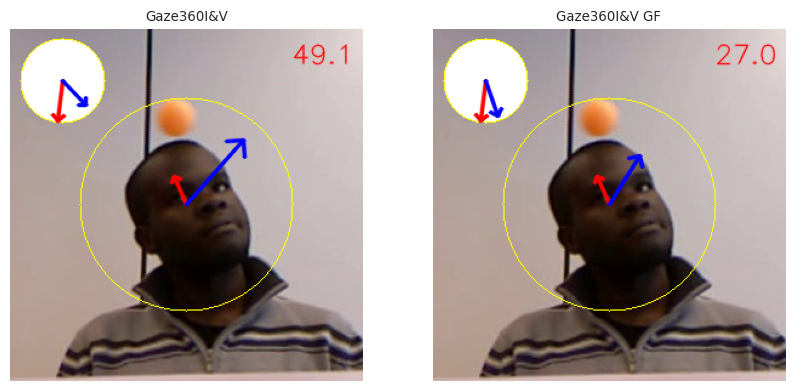

clip_00000081_frame_00001335
tensor([[166, 149, 279, 278]])


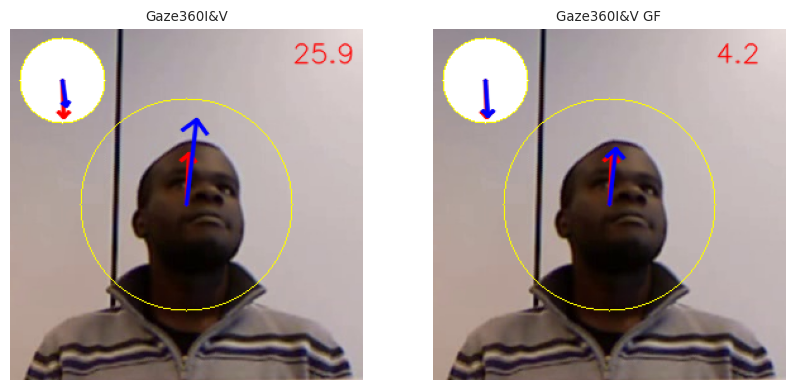

clip_00000077_frame_00003405
tensor([[ 98,   6, 424, 424]])


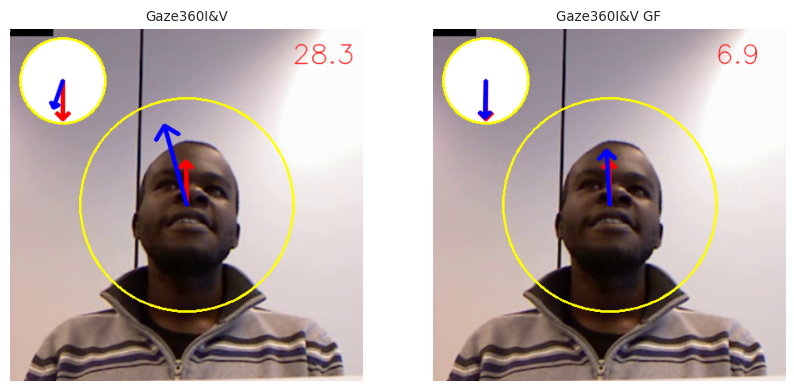

clip_00000031_frame_00004620
tensor([[ 99,  43, 330, 329]])


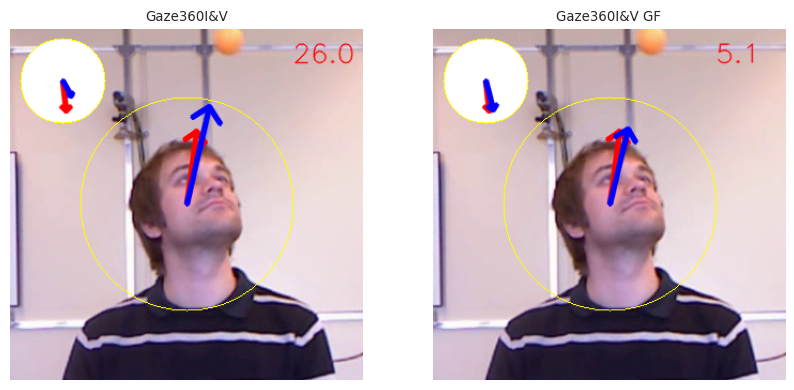

clip_00000081_frame_00002100
tensor([[139, 162, 261, 262]])


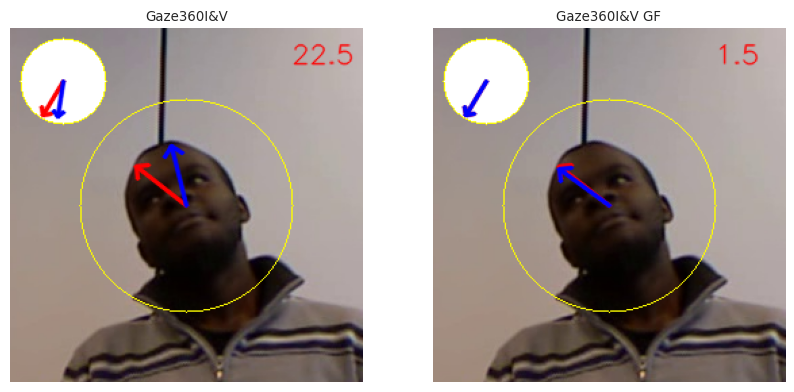

clip_00000081_frame_00001290
tensor([[168, 155, 275, 275]])


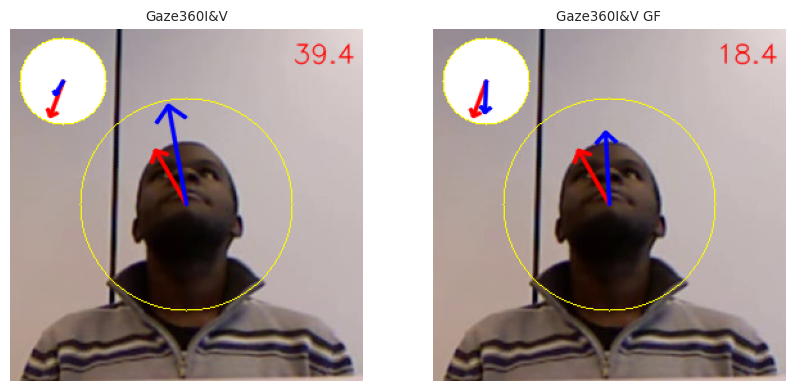

clip_00000005_frame_00001845
tensor([[162,  80, 327, 326]])


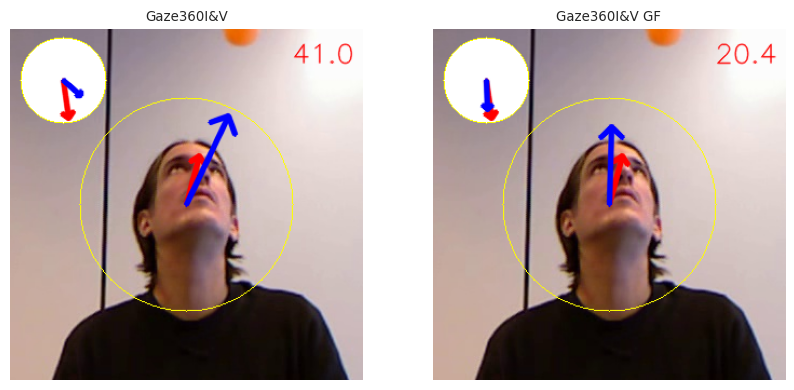

clip_00000013_frame_00001425
tensor([[136, 111, 278, 278]])


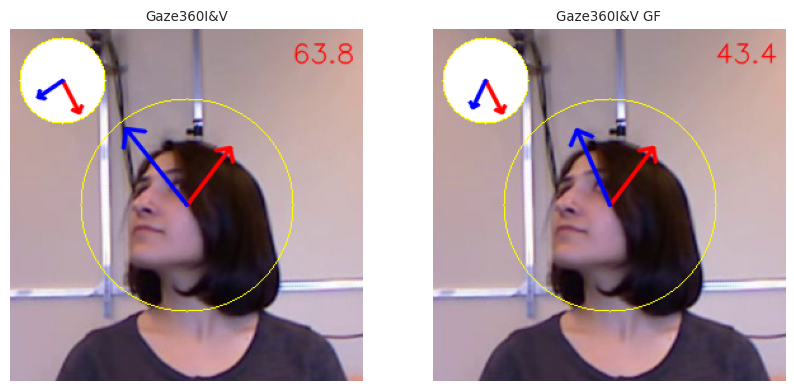

clip_00000081_frame_00004305
tensor([[123, 156, 278, 279]])


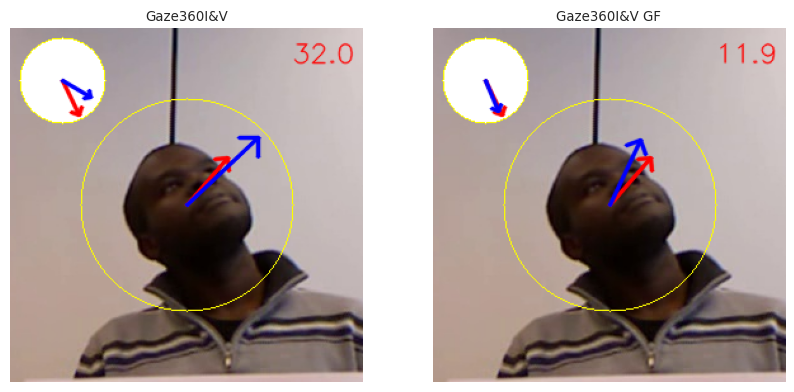

clip_00000005_frame_00003645
tensor([[194,  88, 295, 294]])


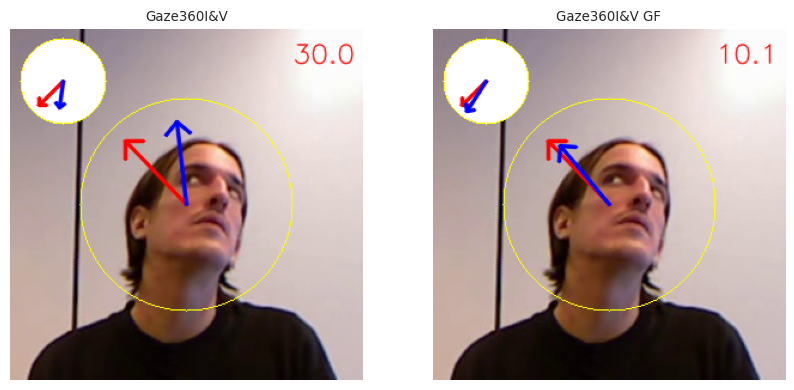

clip_00000081_frame_00003630
tensor([[153, 135, 305, 306]])


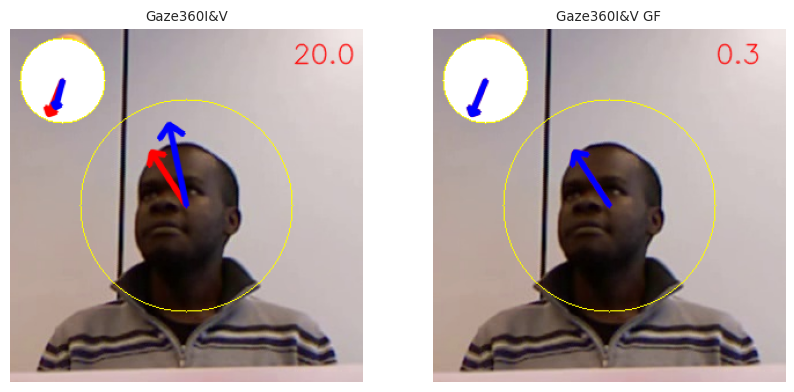

clip_00000081_frame_00004275
tensor([[133, 149, 281, 281]])


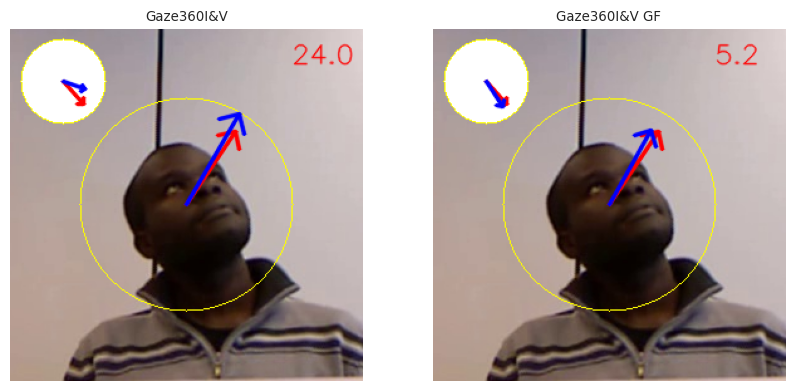

clip_00000081_frame_00001485
tensor([[181, 164, 260, 259]])


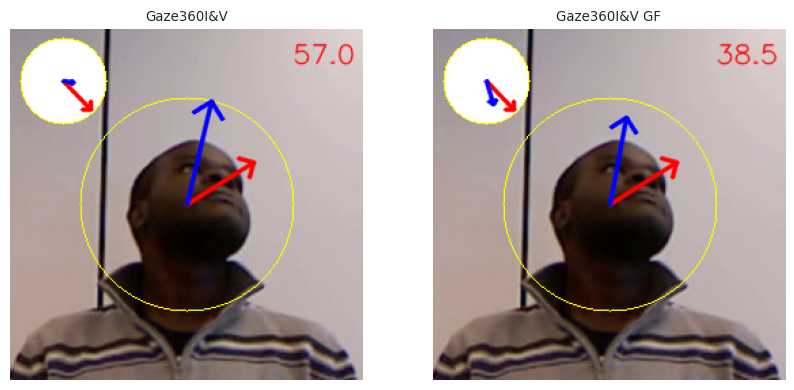

clip_00000081_frame_00001170
tensor([[172, 152, 270, 270]])


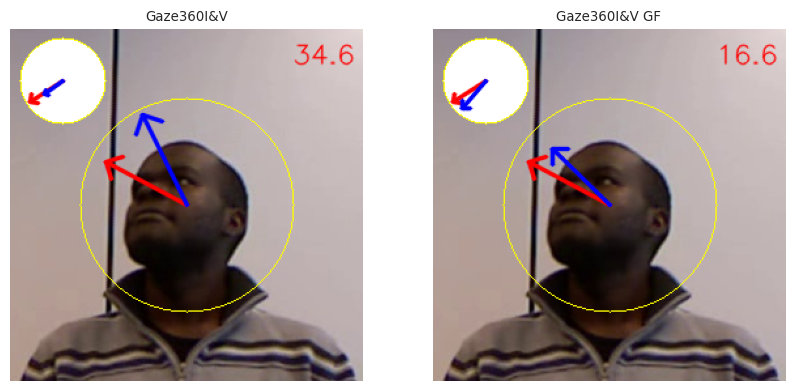

clip_00000082_frame_00002445
tensor([[174, 150, 270, 270]])


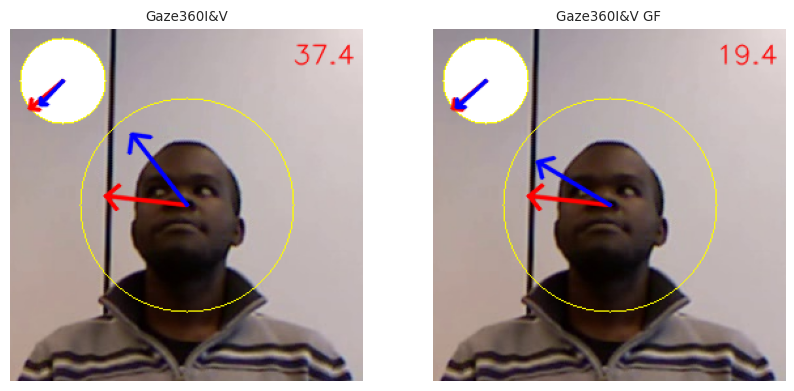

clip_00000081_frame_00001320
tensor([[158, 149, 294, 294]])


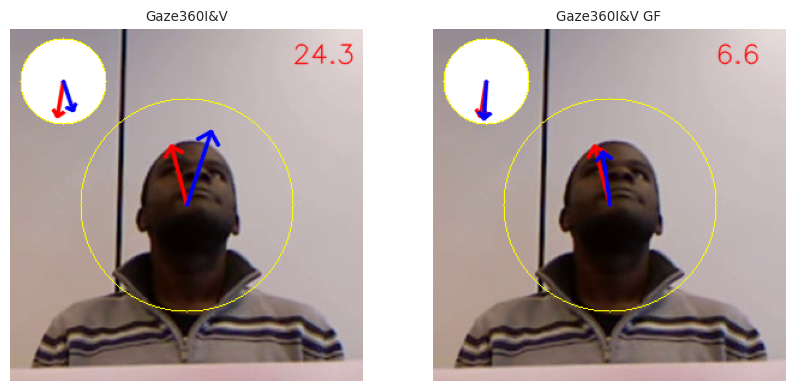

clip_00000005_frame_00004215
tensor([[172,  73, 322, 322]])


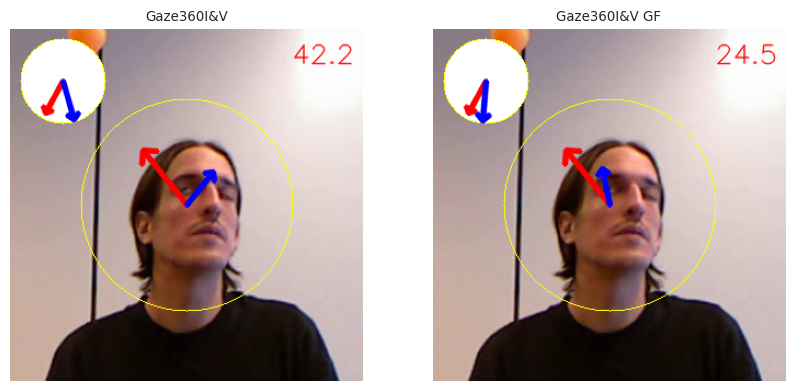

clip_00000077_frame_00002760
tensor([[ 80, -10, 468, 467]])


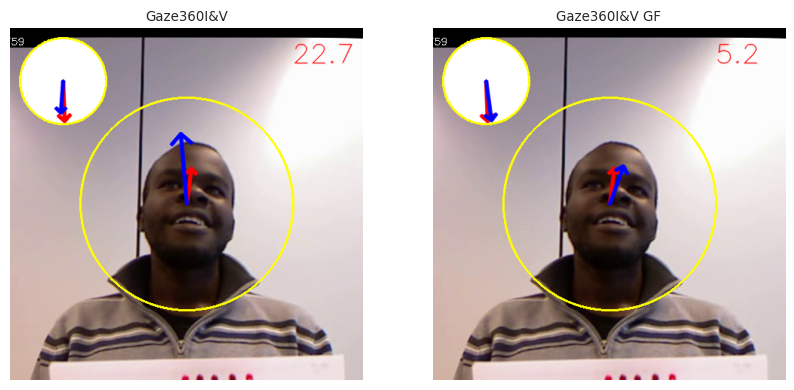

clip_00000077_frame_00003450
tensor([[ 88,  -1, 442, 442]])


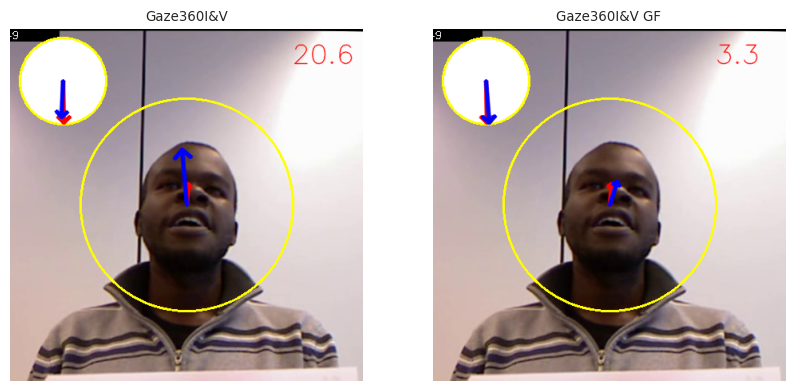

clip_00000082_frame_00000000
tensor([[175, 151, 270, 270]])


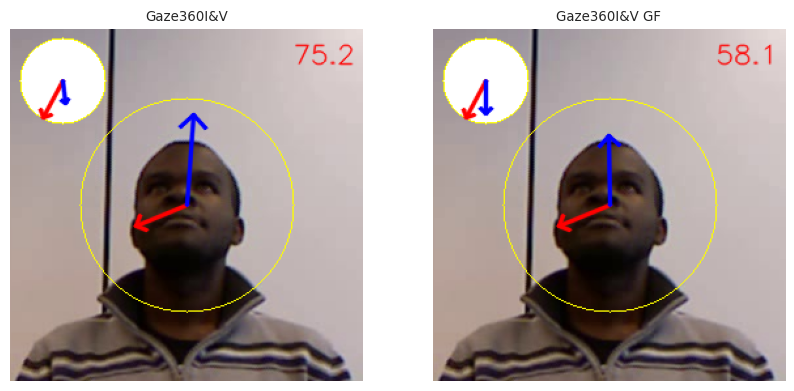

In [24]:
angular_errors = {}

for keys in image_keys:
    angular_error_1 = compute_angular_error(pred['Gaze360I&V'][keys]['frame_pred'], image_db[keys]['other']['gaze_direction'])
    angular_error_2 = compute_angular_error(pred['Gaze360I&V GF'][keys]['frame_pred'], image_db[keys]['other']['gaze_direction'])
    angular_errors[keys] = angular_error_1 - angular_error_2

# sort
sorted_angular_errors = sorted(angular_errors.items(), key=lambda x: x[1], reverse=True)
print(sorted_angular_errors[:10])

for random_key in sorted_angular_errors[10:30]:
    key = random_key[0]
    print(key)
    draw_gaze(key)

In [ ]:
# load gazefollow database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'Eyediap/eyediap_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)
#image_keys = list(image_db.keys())
# model prediction 
# filter only test set 
image_db = {k: v for k,v in image_db.items() if v['split'] == 'test' and v['task'] in ['CS','DS']}

pred = {
    'Gaze360I&V': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl',
}
# load prediction
pred = {'image': get_preditction('eyediap', pred['Gaze360I&V']),
        'video': get_preditction('eyediap_video', pred['Gaze360I&V'])}
image_keys = list(pred['image'].keys())
image_keys = [k for k in image_keys if k in image_db.keys()]

def draw_gaze(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_yolo_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox)
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    
    print(head_bbox)
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    fig, ax = plt.subplots(1, 2, figsize=(10, 10))
    ax = ax.flatten()
    gaze_gt = image_db[keys]['other']['gaze_direction']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    for i , (name , pred_db) in enumerate(pred.items()):
        img_tmp = image.copy()
        
        gaze_pred = pred_db[keys]['frame_pred']
        angular_error = compute_angular_error(gaze_pred, gaze_gt)
        img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
        cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        ax[i].imshow(img_tmp)
        ax[i].set_title(name)
        ax[i].axis('off')
    plt.show()


In [ ]:
angular_errors = {}

for keys in image_keys:
    angular_error_1 = compute_angular_error(pred['image'][keys]['frame_pred'], image_db[keys]['other']['gaze_direction'])
    angular_error_2 = compute_angular_error(pred['video'][keys]['frame_pred'], image_db[keys]['other']['gaze_direction'])
    angular_errors[keys] = angular_error_1 - angular_error_2

# sort
sorted_angular_errors = sorted(angular_errors.items(), key=lambda x: x[1], reverse=True)
print(sorted_angular_errors[:10])

for random_key in sorted_angular_errors[4000:4050]:
    key = random_key[0]
    print(key)
    draw_gaze(key)

In [ ]:
### Visualize prediction on Gaze360 

# load gazefollow database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'Gaze360/gaze360_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)
#image_keys = list(image_db.keys())
# model prediction 
# filter only test set 
#image_db = {k: v for k,v in image_db.items() if v['split'] == 'test'}

pred = {
    'Gaze360I&V': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl',
}
# load prediction
pred = {'image': get_preditction('gaze360', pred['Gaze360I&V']),
        'video': get_preditction('gaze360video', pred['Gaze360I&V'])}
image_keys = list(pred['image'].keys())


def draw_gaze(keys):
    image = cv2.imread(image_db[keys]['image_path_crop'])
    # head_bbox = image_db[keys]['other']['head_bbox_yolo_xyxy']
    # head_bbox = get_head_bbox_crop(head_bbox)
    # image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    # head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    # image = tf.functional.crop(
    #                 image,
    #                 head_bbox[0, 1],
    #                 head_bbox[0, 0],
    #                 head_bbox[0, 3],
    #                 head_bbox[0, 2],
    #             )
    
    # print(head_bbox)
    # # convert to cv2 
    # image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    fig, ax = plt.subplots(1, 8, figsize=(15, 5))
    ax = ax.flatten()
    gaze_gt = image_db[keys]['other']['gaze_dir']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    img_tmp = image.copy()
    gaze_pred = pred['image'][keys]['frame_pred']
    angular_error = compute_angular_error(gaze_pred, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
    ax[0].imshow(img_tmp)
    ax[0].set_title('image')
    ax[0].axis('off')
    
    for i in range(-3,4):
        frame = int(keys.split("_frame_")[1])+i
        new_key = f'clip_{int(keys.split("_")[1]):08d}_frame_{frame:08d}'
        image = cv2.imread(image_db[new_key]['image_path_crop'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        width, height = image.shape[1], image.shape[0]
        try :
            gaze_pred = pred['video'][new_key]['frame_pred']
            gaze_gt =  pred['video'][new_key]['frame_gt']
            angular_error = compute_angular_error(gaze_pred, gaze_gt)
            image = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
            image = draw_3D_gaze(image, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
            cv2.putText(image, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        except: 
            pass

        ax[i+4].imshow(image)
        ax[i+4].set_title(f'frame {i}')
        ax[i+4].axis('off')
    plt.show()


In [ ]:
angular_errors = {}

for keys in image_keys:
    angular_error_1 = compute_angular_error(pred['image'][keys]['frame_pred'], image_db[keys]['other']['gaze_dir'])
    angular_error_2 = compute_angular_error(pred['video'][keys]['frame_pred'], image_db[keys]['other']['gaze_dir'])
    angular_errors[keys] = angular_error_1 - angular_error_2

# sort
sorted_angular_errors = sorted(angular_errors.items(), key=lambda x: x[1], reverse=True)
print(sorted_angular_errors[:10])

for random_key in sorted_angular_errors[450:500]:
    key = random_key[0]
    print(key)
    draw_gaze(key)

In [ ]:
examples_blink = [
    'clip_00000687_frame_00000741',
    'clip_00000683_frame_00000182',
    'clip_00000268_frame_00000058',
    'clip_00000687_frame_00000741',
    'clip_00000690_frame_00000716'
]
examples_occlusion = [
    'clip_00000429_frame_00000798'
]
examples_eye_movement = [
    'clip_00000278_frame_00000880',
    'clip_00000502_frame_00000552'
]
examples_movement = [
    'clip_00000312_frame_00000006',
    'clip_00000274_frame_00000354',
    'clip_00000644_frame_00000337',
    'clip_00000264_frame_00000759',
    'clip_00000645_frame_00000422'
]

print("Blink")
for key in examples_blink:
    print(key)
    draw_gaze(key)

print("Occlusion")
for key in examples_occlusion:
    print(key)
    draw_gaze(key)

print("Eye movement")
for key in examples_eye_movement:
    print(key)
    draw_gaze(key)

print("Movement")
for key in examples_movement:
    print(key)
    draw_gaze(key)



In [ ]:
final_example = [
    'clip_00000683_frame_00000182',
    'clip_00000690_frame_00000716',
    'clip_00000429_frame_00000798',
    'clip_00000278_frame_00000880',
    'clip_00000502_frame_00000552',
    'clip_00000312_frame_00000006',
    'clip_00000274_frame_00000354',
]

def draw_on_ax(ax,keys,is_title):
    image = cv2.imread(image_db[keys]['image_path_crop'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    gaze_gt = image_db[keys]['other']['gaze_dir']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    img_tmp = image.copy()
    gaze_pred = pred['image'][keys]['frame_pred']
    angular_error = compute_angular_error(gaze_pred, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
    img_tmp = cv2.resize(img_tmp, (300, 300))
    ax[0].imshow(img_tmp)
    if is_title:
        ax[0].set_title('Image')
    ax[0].axis('off')
    
    for i in range(-3,4):
        frame = int(keys.split("_frame_")[1])+i
        new_key = f'clip_{int(keys.split("_")[1]):08d}_frame_{frame:08d}'
        image = cv2.imread(image_db[new_key]['image_path_crop'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        width, height = image.shape[1], image.shape[0]
        try :
            gaze_pred = pred['video'][new_key]['frame_pred']
            gaze_gt =  pred['video'][new_key]['frame_gt']
            angular_error = compute_angular_error(gaze_pred, gaze_gt)
            image = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
            image = draw_3D_gaze(image, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
            cv2.putText(image, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        except: 
            pass
        # resize the image 
        image = cv2.resize(image, (300, 300))
        ax[i+4].imshow(image)
        if is_title:
            ax[i+4].set_title(f'Frame {i}')
        ax[i+4].axis('off')

fig, ax = plt.subplots(7, 8, figsize=(9,8), sharex = True, sharey = True)

for i, keys in enumerate(final_example):
    if i == 0:
        draw_on_ax(ax[i],keys, is_title = True)
    else:
        draw_on_ax(ax[i],keys, is_title = False)
plt.tight_layout()
fig.savefig('paper_images/gaze360_image_vs_video.png')
plt.show()



In [ ]:
final_example = [
    'clip_00000683_frame_00000182',
    'clip_00000690_frame_00000716',
    'clip_00000429_frame_00000798',
    'clip_00000278_frame_00000880',
    'clip_00000502_frame_00000552',
    'clip_00000312_frame_00000006',
    'clip_00000274_frame_00000354',
]

def draw_on_ax(keys):
    image_collection = []
    image = cv2.imread(image_db[keys]['image_path_crop'])
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    gaze_gt = image_db[keys]['other']['gaze_dir']
    img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    img_tmp = image.copy()
    gaze_pred = pred['image'][keys]['frame_pred']
    angular_error = compute_angular_error(gaze_pred, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
    img_tmp = cv2.resize(img_tmp, (300, 300))
    image_collection.append(img_tmp)
    
    for i in range(-3,4):
        frame = int(keys.split("_frame_")[1])+i
        new_key = f'clip_{int(keys.split("_")[1]):08d}_frame_{frame:08d}'
        image = cv2.imread(image_db[new_key]['image_path_crop'])
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        width, height = image.shape[1], image.shape[0]
        try :
            gaze_pred = pred['video'][new_key]['frame_pred']
            gaze_gt =  pred['video'][new_key]['frame_gt']
            angular_error = compute_angular_error(gaze_pred, gaze_gt)
            image = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
            image = draw_3D_gaze(image, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
            cv2.putText(image, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
        except: 
            pass
        # resize the image 
        image = cv2.resize(image, (300, 300))
        image_collection.append(image)
    return image_collection

image_collection = []
for i, keys in enumerate(final_example):
    image_collection += draw_on_ax(keys)


grid_width = 8
grid_height = 7
img_width,img_height = 305,305
grid_image = Image.new('RGB', (img_width * grid_width, img_height * grid_height), color = (255,255,255))
# make it with a white background


image_collection = [Image.fromarray(img_rgb) for img_rgb in image_collection]
# Step 4: Paste images into the grid
for index, image in enumerate(image_collection):
    x = (index % grid_width) * img_width
    y = (index // grid_width) * img_height
   
    grid_image.paste(image, (int(x), int(y)))

# Step 5: Save or show the combined image
grid_image.save('paper_images/gaze360_image_vs_video.png')

# plt.tight_layout()
# fig.savefig('paper_images/gaze360_image_vs_video.png')
# plt.show()




In [ ]:
angular_errors_image = []
angular_errors_video = []
angular_difference = []
for keys in image_keys:
    angular_error_image = compute_angular_error(pred['image'][keys]['frame_pred'], image_db[keys]['other']['gaze_dir'])
    angular_error_video = compute_angular_error(pred['video'][keys]['frame_pred'], image_db[keys]['other']['gaze_dir'])
    angular_error_camera = compute_angular_error([0,0,-1], image_db[keys]['other']['gaze_dir'])
    angular_errors_image.append([angular_error_camera, angular_error_image])
    angular_errors_video.append([angular_error_camera, angular_error_video])
    angular_difference.append([angular_error_camera , angular_error_image - angular_error_video])

# the effect of image vs video on gaze estimation: 
# plot 
angular_errors_image = np.array(angular_errors_image)
angular_errors_video = np.array(angular_errors_video)
angular_difference = np.array(angular_difference)   

fig, ax = plt.subplots(1, 1, figsize=(6, 6))
#ax.scatter(angular_errors_image[:,0], angular_errors_image[:,1], label='image')
#ax.scatter(angular_errors_video[:,0], angular_errors_video[:,1], label='video')
# ax.scatter(angular_difference[:,0], angular_difference[:,1], label='difference')

# plot an error bar of standard deviation by bin of 5 degree and plot the middle of bin 2.5*i 
# bin the data
x = np.array([5*i for i in range(1,int(180/5))])

y_diff = []
y_diff_std = []
for i in range(1,int(180/5)):
    mask = (angular_difference[:,0] >= 5*i) & (angular_difference[:,0] < 5*(i+1))
    y_diff.append(np.mean(angular_difference[mask,1]))
    y_diff_std.append(np.std(angular_difference[mask,1]))

y_diff = np.array(y_diff)
y_diff_std = np.array(y_diff_std)

ax.errorbar(x, y_diff, yerr=y_diff_std, label='difference')
# plot the 0 line
ax.plot([0,180], [0,0], 'k--')
ax.legend()
ax.set_xlabel('Gaze direction w.r.t camera (degrees)')
ax.set_ylabel('Angular error diffence image - video (degrees)')
ax.set_title('Effect of image against video on different gaze direction')
fig.savefig('paper_images/plot_image_video_gaze360.png',dpi = 300)
plt.show()

### Visualization prediction on VAT 



In [56]:
#load database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'VAT/vat_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)
#image_keys = list(image_db.keys())
# model prediction 
# filter only test set 
#image_db = {k: v for k,v in image_db.items() if v['split'] == 'test'}

pred = {
    'Gaze360I&V image': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/prediction/pred_gaze_vat.pkl', 
    'Gaze360I&V video': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/prediction/pred_gaze_vatvideo.pkl',
    'Gaze360I&V GF image': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-11_16-08-57/logs/train/runs/run_0/prediction/pred_gaze_vat.pkl',
    'Gaze360I&V GF video': '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-11_16-08-57/logs/train/runs/run_0/prediction/pred_gaze_vatvideo.pkl',
}
# load prediction
pred = { 'GI&V image': pickle.load(open(pred['Gaze360I&V image'],'rb')),
         'GI&V video': pickle.load(open(pred['Gaze360I&V video'],'rb')),
         'GI&V GF image': pickle.load(open(pred['Gaze360I&V GF image'],'rb')),
         'GI&V GF video': pickle.load(open(pred['Gaze360I&V GF video'],'rb')),}
image_keys = list(pred['GI&V image'].keys())

def draw_gaze_image(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox,ratio=1.7)
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    
    print(head_bbox)
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    fig, ax = plt.subplots(1, 1, figsize=(5, 5))
    #gaze_gt = image_db[keys]['other']['gaze_dir']
    #img_tmp = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)

    img_tmp = image.copy()
    gaze_pred = pred['GI&V image'][keys]['gaze_vector_pred']
    gaze_pred_gf = pred['GI&V GF image'][keys]['gaze_vector_pred']
    #angular_error = compute_angular_error(gaze_pred, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred_gf, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    #cv2.putText(img_tmp, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
    img_tmp = cv2.resize(img_tmp, (300, 300))
    ax.imshow(img_tmp)
    ax.set_title('image')
    ax.axis('off')
    
    # for i in range(-9,10,3):
    #     frame = int(keys.split("_frame_")[1])+i
    #     new_key = f'clip_{int(keys.split("_")[1]):08d}_frame_{frame:08d}'
    #     if new_key not in image_db.keys():
    #         image = np.ones((300,300,3),dtype=np.uint8)*255
    #     else:
    #         image = cv2.imread(image_db[new_key]['image_path_crop'])
    #         image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    #         width, height = image.shape[1], image.shape[0]
    #         try :
    #             gaze_pred = pred['video'][new_key]['frame_pred']
    #             gaze_gt =  pred['video'][new_key]['frame_gt']
    #             angular_error = compute_angular_error(gaze_pred, gaze_gt)
    #             image = draw_3D_gaze(image, gaze_gt, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
    #             image = draw_3D_gaze(image, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    #             cv2.putText(image, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
    #         except: 
    #             pass
    #     # resize the image
    #     image = cv2.resize(image, (300, 300))
    #     ax[i+4].imshow(image)
    #     ax[i+4].set_title(f'frame {i}')
    #     ax[i+4].axis('off')
    plt.show()
    
def draw_gaze_video(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox,ratio = 1)
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    
    print(head_bbox)
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    fig, ax = plt.subplots(1, 8, figsize=(25, 8))
    ax = ax.flatten()
    img_tmp = image.copy()
    gaze_pred = pred['GI&V image'][keys]['gaze_vector_pred']
    gaze_pred_gf = pred['GI&V GF image'][keys]['gaze_vector_pred']
    #angular_error = compute_angular_error(gaze_pred, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred_gf, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    img_tmp = cv2.resize(img_tmp, (300, 300))
    ax[0].imshow(img_tmp)
    ax[0].set_title('image')
    ax[0].axis('off')
    
    for i in range(-9,10,3):
        frame = int(keys.split("_")[3])+i
        new_key = f'clip_{int(keys.split("_")[1]):08d}_frame_{frame:08d}_face_{keys.split("_face_")[1]}'
        if new_key not in image_db.keys():
            image = np.ones((300,300,3),dtype=np.uint8)*255
        else:
            image = cv2.imread(image_db[new_key]['image_path'])
            head_bbox = image_db[new_key]['other']['head_bbox_xyxy']
            head_bbox = get_head_bbox_crop(head_bbox,ratio = 1)
            image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
            head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
            image = tf.functional.crop(
                            image,
                            head_bbox[0, 1],
                            head_bbox[0, 0],
                            head_bbox[0, 3],
                            head_bbox[0, 2],
                        )
           
            # convert to cv2 
            image = image.permute(1,2,0).numpy()
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            width, height = image.shape[1], image.shape[0]
            try :
                gaze_pred = pred['GI&V image'][new_key]['gaze_vector_pred']
                gaze_pred_gf = pred['GI&V GF video'][new_key]['gaze_vector_pred']
                #gaze_gt =  pred['video'][new_key]['frame_gt']
                #angular_error = compute_angular_error(gaze_pred, gaze_gt)
                image = draw_3D_gaze(image, gaze_pred, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
                image = draw_3D_gaze(image, gaze_pred_gf, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
                #cv2.putText(image, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
            except: 
                pass
        # resize the image
        image = cv2.resize(image, (300, 300))
        ax[i//3+4].imshow(image)
        ax[i//3+4].set_title(f'frame {i}')
        ax[i//3+4].axis('off')
    plt.show()

clip_00000065_frame_00003060_face_00000004
tensor([[262,  25, 246, 246]])


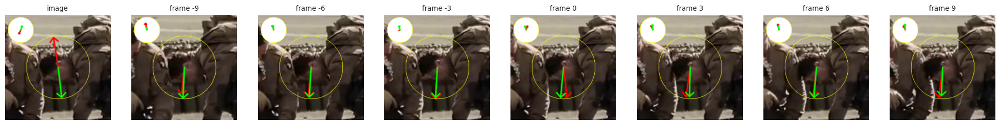

clip_00000207_frame_00009316_face_00000001
tensor([[584, 122, 160, 160]])


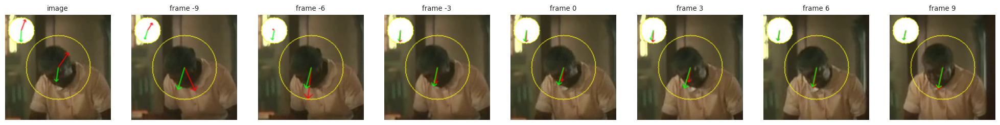

clip_00000469_frame_00037851_face_00000001
tensor([[771, 128, 248, 248]])


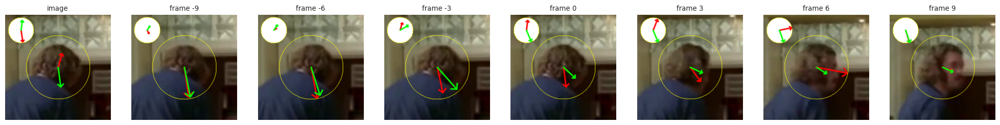

clip_00000207_frame_00009292_face_00000001
tensor([[581, 121, 176, 176]])


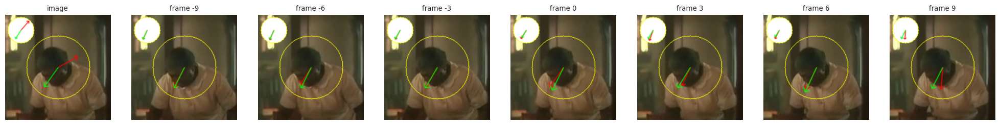

clip_00000024_frame_00003246_face_00000000
tensor([[-49,  52, 506, 506]])


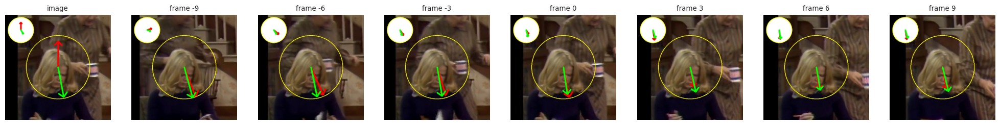

clip_00000469_frame_00037837_face_00000001
tensor([[749, 150, 250, 250]])


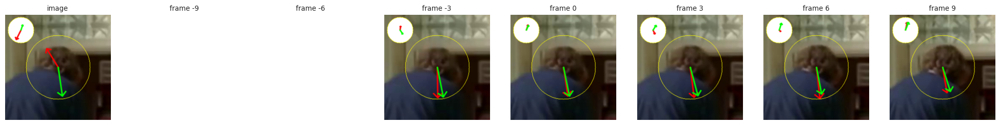

clip_00000068_frame_00006598_face_00000000
tensor([[ 405, -159,  638,  637]])


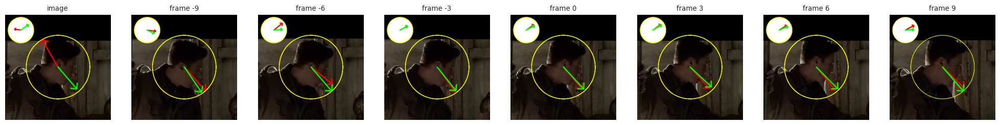

clip_00000482_frame_00001476_face_00000001
tensor([[167, 186, 190, 190]])


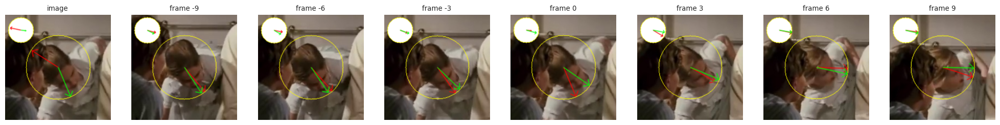

clip_00000181_frame_00013130_face_00000002
tensor([[-650, -377, 1827, 1828]])


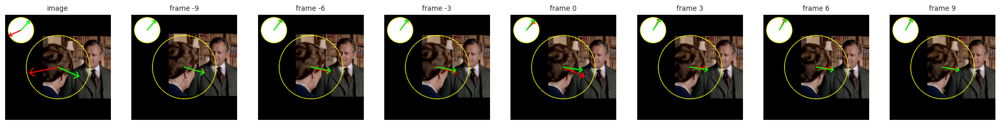

clip_00000367_frame_00001894_face_00000000
tensor([[ 43,  82, 222, 222]])


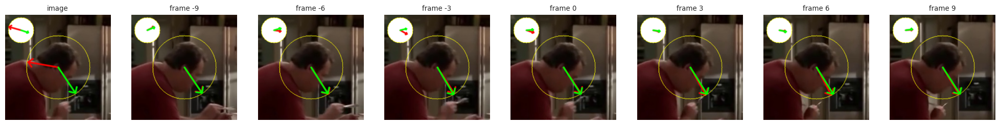

clip_00000065_frame_00003059_face_00000004
tensor([[259,  26, 246, 246]])


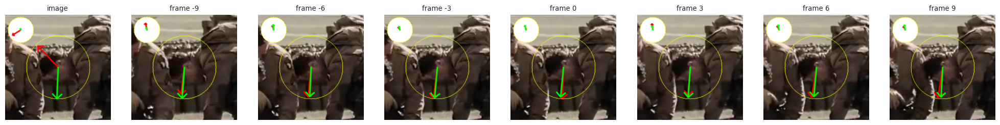

clip_00000199_frame_00019312_face_00000002
tensor([[ 75,   8, 186, 186]])


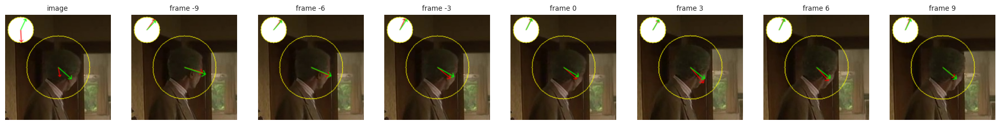

clip_00000367_frame_00001913_face_00000000
tensor([[ -2,  79, 222, 222]])


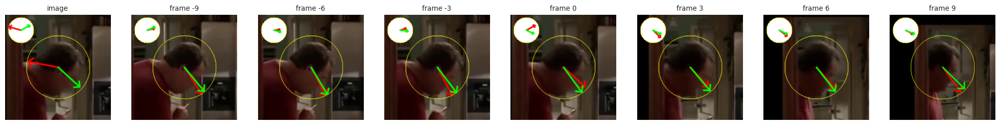

clip_00000017_frame_00001466_face_00000001
tensor([[293, 124, 500, 500]])


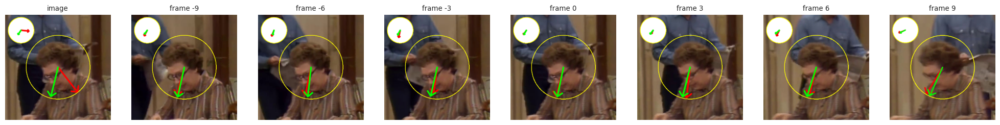

clip_00000003_frame_00017847_face_00000000
tensor([[580, 330, 348, 348]])


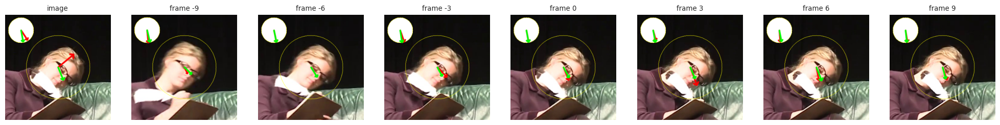

clip_00000189_frame_00003197_face_00000001
tensor([[1055,   75,  856,  856]])


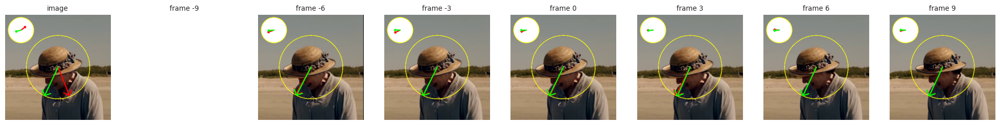

clip_00000051_frame_00001591_face_00000003
tensor([[590, 157, 324, 324]])


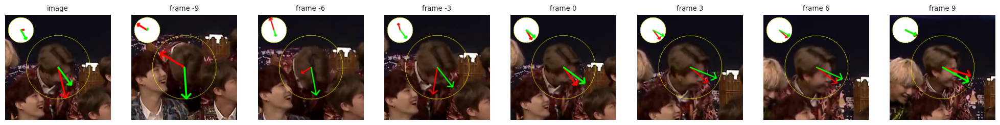

In [13]:
# example where trained on GF this a bit better than the other
# clip_00000229_frame_00000111_face_00000003
# clip_00000482_frame_00002188_face_00000000
# clip_00000285_frame_00006066_face_00000000 
# clip_00000229_frame_00000017_face_00000001
# clip_00000562_frame_00001818_face_00000000
# clip_00000557_frame_00010472_face_00000001


examples = [ 
'clip_00000065_frame_00003060_face_00000004',
'clip_00000207_frame_00009316_face_00000001',
'clip_00000469_frame_00037851_face_00000001',
'clip_00000207_frame_00009292_face_00000001',
'clip_00000024_frame_00003246_face_00000000',
'clip_00000469_frame_00037837_face_00000001',
'clip_00000068_frame_00006598_face_00000000',
'clip_00000482_frame_00001476_face_00000001',
'clip_00000181_frame_00013130_face_00000002',
'clip_00000367_frame_00001894_face_00000000',
'clip_00000065_frame_00003059_face_00000004',
'clip_00000199_frame_00019312_face_00000002',
'clip_00000367_frame_00001913_face_00000000',
'clip_00000017_frame_00001466_face_00000001',
'clip_00000003_frame_00017847_face_00000000',
'clip_00000189_frame_00003197_face_00000001',
'clip_00000051_frame_00001591_face_00000003',
]


for key in examples: 
    print(key)
    draw_gaze_video(key)


In [49]:
def draw_gaze_video_final(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox,ratio = 1)
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    
    print(head_bbox)
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    width, height = image.shape[1], image.shape[0]
    #fig, ax = plt.subplots(1, 7, figsize=(25, 8))
    # ax = ax.flatten()
    # img_tmp = image.copy()
    # gaze_pred = pred['GI&V image'][keys]['gaze_vector_pred']
    # gaze_pred_gf = pred['GI&V GF image'][keys]['gaze_vector_pred']
    # #angular_error = compute_angular_error(gaze_pred, gaze_gt)
    # img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
    # img_tmp = draw_3D_gaze(img_tmp, gaze_pred_gf, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    # img_tmp = cv2.resize(img_tmp, (300, 300))
    # ax[0].imshow(img_tmp)
    # ax[0].set_title('image')
    # ax[0].axis('off')
    
    image_collection = []
    for i in range(-9,10,3):
        frame = int(keys.split("_")[3])+i
        new_key = f'clip_{int(keys.split("_")[1]):08d}_frame_{frame:08d}_face_{keys.split("_face_")[1]}'
        if new_key not in image_db.keys():
            image = np.ones((300,300,3),dtype=np.uint8)*255
        else:
            image = cv2.imread(image_db[new_key]['image_path'])
            head_bbox = image_db[new_key]['other']['head_bbox_xyxy']
            head_bbox = get_head_bbox_crop(head_bbox,ratio = 1)
            image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
            head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
            image = tf.functional.crop(
                            image,
                            head_bbox[0, 1],
                            head_bbox[0, 0],
                            head_bbox[0, 3],
                            head_bbox[0, 2],
                        )
           
            # convert to cv2 
            image = image.permute(1,2,0).numpy()
            image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
            image = cv2.resize(image, (600, 600))
            width, height = image.shape[1], image.shape[0]
            try :
                gaze_pred = pred['GI&V GF image'][new_key]['gaze_vector_pred']
                gaze_pred_gf = pred['GI&V GF video'][new_key]['gaze_vector_pred']
                #gaze_gt =  pred['video'][new_key]['frame_gt']
                #angular_error = compute_angular_error(gaze_pred, gaze_gt)
                image = draw_3D_gaze(image, gaze_pred, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
                image = draw_3D_gaze(image, gaze_pred_gf, color=(255,0,255), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
                #cv2.putText(image, f'{angular_error:.1f}', (int(0.8*width), int(0.1*height)), cv2.FONT_HERSHEY_SIMPLEX, 0.0025*width, (255, 0, 0), 1, cv2.LINE_AA)
            except: 
                pass
        
        # resize the image
        image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
        # ax[i//3+4].imshow(image)
        # ax[i//3+4].set_title(f'frame {i}')
        # ax[i//3+4].axis('off')
        image_collection.append(image)
    return image_collection

key = 'clip_00000051_frame_00001591_face_00000003'
images = draw_gaze_video_final(key)
# save the images 
os.makedirs('paper_images/main_plot',exist_ok=True)
for i, image in enumerate(images):
    cv2.imwrite(f'paper_images/main_plot/gaze_video_{i}.png',image)

tensor([[590, 157, 324, 324]])


In [58]:
def draw_gaze_image_final(keys):
    image = cv2.imread(image_db[keys]['image_path'])
    head_bbox = image_db[keys]['other']['head_bbox_xyxy']
    head_bbox = get_head_bbox_crop(head_bbox,ratio = 1)
    image = tf.functional.to_dtype(tf.functional.to_image(image), dtype=torch.uint8, scale=True)
    head_bbox = box_convert(torch.from_numpy(np.array(head_bbox).reshape(1,4)), in_fmt="xyxy", out_fmt="xywh")
    image = tf.functional.crop(
                    image,
                    head_bbox[0, 1],
                    head_bbox[0, 0],
                    head_bbox[0, 3],
                    head_bbox[0, 2],
                )
    # convert to cv2 
    image = image.permute(1,2,0).numpy()
    image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    image = cv2.resize(image, (600, 600))
    # width, height = image.shape[1], image.shape[0]
    # fig, ax = plt.subplots(1, 1, figsize=(5, 5))

    img_tmp = image.copy()
    gaze_pred = pred['GI&V image'][keys]['gaze_vector_pred']
    gaze_pred_gf = pred['GI&V GF image'][keys]['gaze_vector_pred']
    #angular_error = compute_angular_error(gaze_pred, gaze_gt)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred_gf, color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    
    img_tmp = cv2.cvtColor(img_tmp, cv2.COLOR_BGR2RGB)
    return img_tmp

examples = [ 
'clip_00000065_frame_00003060_face_00000004',
'clip_00000207_frame_00009316_face_00000001',
'clip_00000469_frame_00037851_face_00000001',
'clip_00000207_frame_00009292_face_00000001',
'clip_00000024_frame_00003246_face_00000000',
'clip_00000469_frame_00037837_face_00000001',
'clip_00000068_frame_00006598_face_00000000',
'clip_00000482_frame_00001476_face_00000001',
'clip_00000181_frame_00013130_face_00000002',
'clip_00000367_frame_00001894_face_00000000',
'clip_00000065_frame_00003059_face_00000004',
'clip_00000199_frame_00019312_face_00000002',
'clip_00000367_frame_00001913_face_00000000',
'clip_00000017_frame_00001466_face_00000001',
'clip_00000003_frame_00017847_face_00000000',
'clip_00000189_frame_00003197_face_00000001',
'clip_00000051_frame_00001591_face_00000003',
]

examples = [ 'clip_00000189_frame_00003197_face_00000001',
'clip_00000207_frame_00009292_face_00000001',
'clip_00000024_frame_00003246_face_00000000',]

for i,key in enumerate(examples): 
    print(key)
    image = draw_gaze_image_final(key)
    cv2.imwrite(f'paper_images/main_plot/gaze_image_vat_{i}.png',image)

clip_00000189_frame_00003197_face_00000001
clip_00000207_frame_00009292_face_00000001
clip_00000024_frame_00003246_face_00000000


In [ ]:
angular_errors = {}

for keys in image_keys:
    angular_error_1 = compute_angular_error(pred['GI&V image'][keys]['gaze_vector_pred'], pred['GI&V GF image'][keys]['gaze_vector_pred'])
    angular_errors[keys] = angular_error_1

# sort
sorted_angular_errors = sorted(angular_errors.items(), key=lambda x: x[1], reverse=True)
print(sorted_angular_errors[:10])

for random_key in sorted_angular_errors[3100:3150]:
    key = random_key[0]
    print(key)
    draw_gaze_video(key)
    

In [ ]:
angular_errors = {}

for keys in image_keys:
    angular_error_1 = compute_angular_error(pred['GI&V GF video'][keys]['gaze_vector_pred'], pred['GI&V GF image'][keys]['gaze_vector_pred'])
    angular_errors[keys] = angular_error_1

# sort
sorted_angular_errors = sorted(angular_errors.items(), key=lambda x: x[1], reverse=True)
print(sorted_angular_errors[:10])

for random_key in sorted_angular_errors[50:80]:
    key = random_key[0]
    print(key)
    draw_gaze_video(key)

In [ ]:
for i in range(30):
    random_key = random.choice(image_keys)
    print(random_key)
    #draw_gaze_image(random_key)
    draw_gaze_video(random_key)


In [ ]:
examples = ['clip_00000224_frame_00000083_face_00000002',
            'clip_00000448_frame_00095125_face_00000001',
            'clip_00000141_frame_00000136_face_00000002',
            'clip_00000209_frame_00000132_face_00000000',# over anticipate
            ]

over_anticipation_ex = [
      'clip_00000141_frame_00000136_face_00000002',
      'clip_00000209_frame_00000132_face_00000000',
      'clip_00000342_frame_00023760_face_00000001',
      'clip_00000150_frame_00005675_face_00000002',
      'clip_00000311_frame_00046568_face_00000002',
      'clip_00000080_frame_00018542_face_00000000'
]

examples_v2 = ['clip_00000299_frame_00004957_face_00000000']

In [ ]:
data = pickle.load(open('/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-10_11-10-56/logs/train/runs/run_0/prediction/pred_gaze_vat.pkl', 'rb'))


In [ ]:
print(list(data.keys())[0])
print(data[list(data.keys())[0]])

In [ ]:
for i in range(-9,10,3):
    print(f'frame {i}')


### Main PLOT

In [55]:

image_path = [
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_video_0.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_video_1.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_video_2.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_video_3.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_video_4.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_video_5.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_video_6.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_image_vat_0.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_image_vat_1.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_image_vat_2.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_image_gfie_0.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_image_gfie_1.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_image_mpiiface_1.png',
    '/idiap/temp/pvuillecard/projects/gaze_pretrain/notebooks/paper_images/main_plot/gaze_image_mpiiface_2.png',
]
# load the image with Image
image_collection = [Image.open(img_path) for img_path in image_path]
grid_width = 7
grid_height = 2
img_width,img_height = 605,605
grid_image = Image.new('RGB', (img_width * grid_width, img_height * grid_height), color = (255,255,255))
# make it with a white background

# Step 4: Paste images into the grid
for index, image in enumerate(image_collection):
    x = (index % grid_width) * img_width
    y = (index // grid_width) * img_height
   
    grid_image.paste(image, (int(x), int(y)))

# Step 5: Save or show the combined image
grid_image.save('paper_images/main_image_gaze_2.png')

### Visualize prediction on GF

In [ ]:
# load gazefollow database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'Gazefollow/gazefollow_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)

pred_gf = {
    'omnivore_gaze360': '/idiap/temp/pvuillecard/projects/face_analyser/datasets/Gazefollow/annotations/gaze_pseudo_omnivoreV_gaze360.pkl', 
    'omnivore_gfie': '/idiap/temp/pvuillecard/projects/face_analyser/datasets/Gazefollow/annotations/gaze_pseudo_omnivoreV_gfie.pkl',
    'omnivore_gfie_mps': '/idiap/temp/pvuillecard/projects/face_analyser/datasets/Gazefollow/annotations/gaze_pseudo_omnivoreV_gfie_mps.pkl',
    'omnivore_all': '/idiap/temp/pvuillecard/projects/face_analyser/datasets/Gazefollow/annotations/gaze_pseudo_omnivoreV_360_gfie_mps.pkl',
}

for k, path in pred_gf.items():
    with open(path, 'rb') as f:
        pred_gf[k] = pickle.load(f)

image_keys = list(pred_gf['omnivore_gaze360'].keys())
dir_output = '/idiap/temp/pvuillecard/datasets/Gazefollow/visualizations_3d_omnivore'
os.makedirs(dir_output, exist_ok=True)

In [ ]:

random_key = random.choice(image_keys)

image = cv2.imread(image_db[random_key]['image_path_crop'])
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
gaze_gt = image_db[random_key]['other']['gaze_vector']

fig, ax = plt.subplots(2, 2, figsize=(10, 10))
ax = ax.flatten()
for i , (name , pred_db) in enumerate(pred_gf.items()):
    img_tmp = image.copy()
    gaze_pred = pred_db[random_key]['gaze_vector_pred']
    img_tmp = draw_3D_gaze(img_tmp, list(gaze_gt)+[0], color=(255,0,0), thickness=0.01, d = 0.3, d_top = 0.4)
    img_tmp = draw_3D_gaze(img_tmp, gaze_pred, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4)
    ax[i].imshow(img_tmp)
    ax[i].set_title(name)
    ax[i].axis('off')

# save images
fig.savefig(os.path.join(dir_output, f'{random_key}.png'))
#plt.close(fig)

### Check prediction at the boarder of GFIE

In [ ]:


path = '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/generalize/run_2024-07-04_17-41-31/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl'
mode_angular = 'cartesian'
with open(path, 'rb') as f:
    exp_results = pickle.load(f)

angular_error_all = {}
k = 2 if mode_angular == 'spherical' else 3
exp_results['frame_pred'] = exp_results['frame_pred'].view(-1, k).numpy()
exp_results['frame_gt'] = exp_results['frame_gt'].view(-1, k).numpy()
exp_results['frame_id'] = exp_results['frame_id'].view(-1).numpy()
exp_results['video_id'] = exp_results['video_id'].view(-1).numpy()
exp_results['person_id'] = exp_results['person_id'].view(-1).numpy()
exp_results['data_id'] = exp_results['data_id'].view(-1).numpy()

with open('/idiap/temp/pvuillecard/projects/face_analyser/datasets/GFIE/gfie_image_database.pkl', 'rb') as f:
    image_db_gfie = pickle.load(f)

with open('/idiap/temp/pvuillecard/projects/face_analyser/datasets/GFIE/gfie_clip_database.pkl', 'rb') as f:
    clip_db_gfie = pickle.load(f)

count_border = 0
# flag the frame at the boarder of the clip
for key_clip, clip in clip_db_gfie.items():
    imgs_id = clip['image_ids'][:2] + clip['image_ids'][-2:]
    print(imgs_id)
    for img_id in imgs_id:
        image_db_gfie[img_id]['is_clip_border'] = True
        count_border += 1
print(f'Number of border clip/image: {count_border}')

for key_image, image in image_db_gfie.items():
    if 'is_clip_border' not in image:
        image['is_clip_border'] = False

pred_gifie = {}
for i in range(len(exp_results['frame_id'])):
    if exp_results['data_id'][i] == 2:
        if image_db_gfie[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}']['is_clip_border']:
            pred_gifie[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
                'frame_pred': exp_results['frame_pred'][i],
                'frame_gt': exp_results['frame_gt'][i],
                'angular_error': compute_angular_error(exp_results['frame_pred'][i], exp_results['frame_gt'][i])
            }

average_image = np.mean([v['angular_error'] for v in pred_gifie.values()])
print(f'Border average angular error image: {average_image}')

pred_gifie = {}
for i in range(len(exp_results['frame_id'])):
    if exp_results['data_id'][i] == 8:
        if image_db_gfie[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}']['is_clip_border']:
            pred_gifie[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
                'frame_pred': exp_results['frame_pred'][i],
                'frame_gt': exp_results['frame_gt'][i],
                'angular_error': compute_angular_error(exp_results['frame_pred'][i], exp_results['frame_gt'][i])
            }

average_video = np.mean([v['angular_error'] for v in pred_gifie.values()])
print(f'Border average angular error video : {average_video}')

In [ ]:
# load childplay database
data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'ChildPlay/childplay_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)

with open(os.path.join(data_dir, 'ChildPlay/childplay_clip_database.pkl'), 'rb') as f:
    clip_db = pickle.load(f)

path_pred = '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/gaze360_model/run_2024-06-19_11-13-54/logs/train/runs/run_0/prediction/pred_gaze_childplay.pkl'
with open(path_pred, 'rb') as f:
    pred_db = pickle.load(f)

dir_output = '/idiap/temp/pvuillecard/datasets/ChildPlay/visualizations_3d_pred_v2'
os.makedirs(dir_output, exist_ok=True)


In [ ]:
random_key = random.choice(list(image_db.keys()))
print(random_key)
print(image_db[random_key])
random_key = random.choice(list(pred_db.keys()))
print(random_key)

# find the clip in pred 
clips = [ k.split('_frame')[0] for k in list(pred_db.keys())]
clips = list(set(clips))
print(clips)

In [ ]:
for k,v in clip_db[clips[0]].items():
    print(k,v)

In [ ]:
for i in range(len(clips)):
    clid_selected = clips[i]
    clip_meta = clip_db[clid_selected]
    image_id_pred = list(pred_db.keys())

    frames = list(set(clip_meta['frames']))
    frames.sort()
    count = 0
    video_output = []
    for frame in frames: 
        name = f"{clid_selected}_frame_{frame:08d}"
        face_ids = [ k for k in image_id_pred if name in k]
        image = cv2.imread( image_db[face_ids[0]]['image_path'])
        for face_id in face_ids:

            pred_meta = pred_db[face_id]
            face_meta = image_db[face_id]
            face_bbox = face_meta['other']['head_bbox_xyxy']
            gaze_pred = pred_meta['gaze_vector_pred']
            pos = [int(face_bbox[0]+face_bbox[2])//2, int(face_bbox[1]+face_bbox[3])//2]
            image = draw_3D_vector(image, gaze_pred, pos, color=(0,255,0), thickness=0.006, d = 0.1)
        #plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        video_output.append(image)
        count += 1
        if count > 300:
            break

    # using torch to save video
    print(video_output[0].shape)
    video_output = [cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) for frame in video_output]
    video_output = [Image.fromarray(frame) for frame in video_output]
    video_output = [PILToTensor()(frame) for frame in video_output]
    video_output = torch.stack(video_output)
    print(video_output.shape)
    video_output = video_output.permute(0, 2, 3, 1)
    print(video_output.shape)
    write_video(os.path.join(dir_output,f'{clid_selected}.mp4'), video_output, 30.0)

In [ ]:
# load childplay database

data_dir = '/idiap/temp/pvuillecard/datasets' 
with open(os.path.join(data_dir, 'Eyediap/eyediap_image_database.pkl'), 'rb') as f:
    image_db = pickle.load(f)

with open(os.path.join(data_dir, 'Eyediap/eyediap_clip_database.pkl'), 'rb') as f:
    clip_db = pickle.load(f)

path_pred = '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/scripts/generalize.yaml/run_2024-06-26_21-20-30/logs/train/runs/run_0/prediction/pred_gaze_eyediap.pkl'
with open(path_pred, 'rb') as f:
    pred_db = pickle.load(f)

dir_output = '/idiap/temp/pvuillecard/datasets/Eyediap/visualizations_3d_pred_v2'
os.makedirs(dir_output, exist_ok=True)




In [ ]:
random_key = random.choice(list(image_db.keys()))
print(random_key)
print(image_db[random_key])
random_key = random.choice(list(pred_db.keys()))
print(random_key)

In [ ]:
# find the clip in pred 
clips = [ k.split('_frame')[0] for k in list(pred_db.keys())]
clips = list(set(clips))
print(clips)
# select 5 clips 
clips = random.sample(clips, 5)

In [ ]:

for i in range(len(clips)):
    clid_selected = clips[i]
    clip_meta = clip_db[clid_selected]
    image_id_pred = list(pred_db.keys())

    frames = list(set(clip_meta['frames']))
    frames.sort()
    count = 0
    video_output = []
    for frame in frames: 
        name = f"{clid_selected}_frame_{frame:08d}"
        face_ids = [ k for k in image_id_pred if name in k]
        image = cv2.imread( image_db[face_ids[0]]['image_path'])
        for face_id in face_ids:

            pred_meta = pred_db[face_id]
            face_meta = image_db[face_id]
            face_bbox = face_meta['other']['head_bbox_yolo_xyxy']
            gaze_pred = pred_meta['gaze_vector_pred']
            gaze_gt = face_meta['other']['gaze_direction']
            pos = [int(face_bbox[0]+face_bbox[2])//2, int(face_bbox[1]+face_bbox[3])//2]
            image = draw_3D_vector(image, gaze_pred, pos, color=(255,0,0), thickness=0.006, d = 0.14)
            image = draw_3D_vector(image, gaze_gt, pos, color=(0,155,0), thickness=0.006, d = 0.14)
        #plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
        video_output.append(image)
        count += 1
        if count > 300:
            break

    # using torch to save video
    print(video_output[0].shape)
    video_output = [cv2.cvtColor(frame, cv2.COLOR_BGR2RGB) for frame in video_output]
    video_output = [Image.fromarray(frame) for frame in video_output]
    video_output = [PILToTensor()(frame) for frame in video_output]
    video_output = torch.stack(video_output)
    print(video_output.shape)
    video_output = video_output.permute(0, 2, 3, 1)
    print(video_output.shape)
    write_video(os.path.join(dir_output,f'{clid_selected}.mp4'), video_output, 24.0)

### visualization miss cases

In [ ]:
# load the prediction and ground truth
# load gazefollow database
def compute_angular_error(pred,gt):
    pred_norm = pred/np.linalg.norm(pred)
    gt_norm = gt/np.linalg.norm(gt)
    error = np.arccos(np.clip(np.dot(pred_norm,gt_norm), -1.0, 1.0))*180/np.pi
    return error


path = '/idiap/temp/pvuillecard/projects/gaze_pretrain/logs/experiments/gaze360_model/run_2024-06-19_11-13-54/logs/train/runs/run_0/metric/test/prediction_test_gaze_epoch_0.pkl'
mode_angular = 'cartesian'
with open(path, 'rb') as f:
    exp_results = pickle.load(f)

angular_error_all = {}
k = 2 if mode_angular == 'spherical' else 3
exp_results['frame_pred'] = exp_results['frame_pred'].view(-1, k).numpy()
exp_results['frame_gt'] = exp_results['frame_gt'].view(-1, k).numpy()
exp_results['frame_id'] = exp_results['frame_id'].view(-1).numpy()
exp_results['video_id'] = exp_results['video_id'].view(-1).numpy()
exp_results['person_id'] = exp_results['person_id'].view(-1).numpy()
exp_results['data_id'] = exp_results['data_id'].view(-1).numpy()

with open('/idiap/temp/pvuillecard/projects/face_analyser/datasets/Gaze360/gaze360_image_database.pkl', 'rb') as f:
    image_db_gaze360 = pickle.load(f)

with open('/idiap/temp/pvuillecard/projects/face_analyser/datasets/GFIE/gfie_image_database.pkl', 'rb') as f:
    image_db_gfie = pickle.load(f)

with open('/idiap/temp/pvuillecard/projects/face_analyser/datasets/MPSGaze/mpsgaze_image_database.pkl', 'rb') as f:
    image_db_mpsgaze = pickle.load(f)


pred_gaze360 = {}
for i in range(len(exp_results['frame_id'])):
    if exp_results['data_id'][i] == 1:
        pred_gaze360[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
            'frame_pred': exp_results['frame_pred'][i],
            'frame_gt': exp_results['frame_gt'][i],
            'angular_error': compute_angular_error(exp_results['frame_pred'][i], exp_results['frame_gt'][i])
        }

pred_gifie = {}
for i in range(len(exp_results['frame_id'])):
    if exp_results['data_id'][i] == 2:
        pred_gifie[f'clip_{exp_results["video_id"][i]:08d}_frame_{exp_results["frame_id"][i]:08d}'] = {
            'frame_pred': exp_results['frame_pred'][i],
            'frame_gt': exp_results['frame_gt'][i],
            'angular_error': compute_angular_error(exp_results['frame_pred'][i], exp_results['frame_gt'][i])
        }

pred_mpsgaze = {}
for i in range(len(exp_results['frame_id'])):
    if exp_results['data_id'][i] == 3:
        pred_mpsgaze[f'frame_{exp_results["frame_id"][i]:08d}_face_{exp_results["person_id"][i]:08d}'] = {
            'frame_pred': exp_results['frame_pred'][i],
            'frame_gt': exp_results['frame_gt'][i],
            'angular_error': compute_angular_error(exp_results['frame_pred'][i], exp_results['frame_gt'][i])
        }




In [ ]:
# sort pred_gaze360 by angular error
pred_gaze360_sorted = {k: v for k, v in sorted(pred_gaze360.items(), key=lambda item: item[1]['angular_error'], reverse=True)}
pred_gifie_sorted = {k: v for k, v in sorted(pred_gifie.items(), key=lambda item: item[1]['angular_error'], reverse=True)}
pred_mpsgaze_sorted = {k: v for k, v in sorted(pred_mpsgaze.items(), key=lambda item: item[1]['angular_error'], reverse=True)}

In [ ]:
print(pred_gaze360_sorted[list(pred_gaze360_sorted.keys())[0]])

In [ ]:
# plot the worst prediction 
for i in range(1000,1050):
    key = list(pred_gaze360_sorted.keys())[i]
    print(key)
    print(pred_gaze360_sorted[key])
    video_id = int(key.split('_frame')[0].split('clip_')[1])
    frame_id = int(key.split('_frame_')[1])
    image = cv2.imread(image_db_gaze360[f'clip_{video_id:08d}_frame_{frame_id:08d}']['image_path_crop'])
    gaze_gt = pred_gaze360_sorted[key]['frame_gt']
    gaze_pred = pred_gaze360_sorted[key]['frame_pred']
    image = draw_3D_gaze(image, gaze_gt, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4)
    image = draw_3D_gaze(image, gaze_pred, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    fig = plt.figure(figsize=(5, 5))
    plt.title('Red: GT, Green: pred')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    #fig.savefig(os.path.join(dir_output, f'{key}.png'))
    #plt.close(fig)

In [ ]:
# plot the worst prediction gfie 
for i in range(4000,4100):
    key = list(pred_gifie_sorted.keys())[i]
    print(key)
    print(pred_gifie_sorted[key])
    video_id = int(key.split('_frame')[0].split('clip_')[1])
    frame_id = int(key.split('_frame_')[1])
    image = cv2.imread(image_db_gfie[key]['image_path_crop'])
    gaze_gt = pred_gifie_sorted[key]['frame_gt']
    gaze_pred = pred_gifie_sorted[key]['frame_pred']
    image = draw_3D_gaze(image, gaze_gt, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4)
    image = draw_3D_gaze(image, gaze_pred, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    fig = plt.figure(figsize=(5, 5))
    plt.title('Red: GT, Green: pred')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    #fig.savefig(os.path.join(dir_output, f'{key}.png'))
    #plt.close(fig)

In [ ]:
# plot the worst prediction mpsgaze
print(len(pred_mpsgaze_sorted))
for i in range(1000,1100):
    key = list(pred_mpsgaze_sorted.keys())[i]
    #print(key)
    #print(pred_mpsgaze_sorted[key])
    image = cv2.imread(image_db_mpsgaze[key]['image_path_crop'])
    gaze_gt = pred_mpsgaze_sorted[key]['frame_gt']
    gaze_pred = pred_mpsgaze_sorted[key]['frame_pred']
    image = draw_3D_gaze(image, gaze_gt, color=(0,0,255), thickness=0.01, d = 0.3, d_top = 0.4)
    image = draw_3D_gaze(image, gaze_pred, color=(0,255,0), thickness=0.01, d = 0.3, d_top = 0.4,apply_zero_corner= False)
    fig = plt.figure(figsize=(5, 5))
    plt.title('Red: GT, Green: pred')
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    #fig.savefig(os.path.join(dir_output, f'{key}.png'))
    #plt.close(fig)